In [1]:
%matplotlib inline

In [2]:
pip install --upgrade pip

Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas as pd
import os
import shutil
from Bio import SeqIO
from Bio import AlignIO
import distance
import editdistance
import math
import subprocess
import numpy as np
import re
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import collections
import pybedtools
import joblib
import itertools as it
import pathlib
import scipy
import sys
sys.modules['sklearn.externals.joblib'] = joblib
from sklearn.externals.joblib import Parallel, delayed
from matplotlib.ticker import FormatStrFormatter
import matplotlib.ticker as ticker

In [3]:
import plotly.express as px

In [6]:
#Input species name based on the 
#Species_DICT= {}
#Species_DICT['APSI']= 'APSI'
Species = 'Pca203'
GENOME_PATH = os.path.abspath('../Mating_type/genome/seperate_haplotype/')
YN00_PATH = os.path.join(GENOME_PATH, 'yn00.ctl')
############yn00.ctl file:###############################
#seqfile = cds_codon.aln * sequence data file name
#outfile = yn.out * main result file
#verbose = 0 * 1: detailed output (list sequences), 0: concise output
#icode = 0 * 0:universal code; 1:mammalian mt; 2-10:see below
#weighting = 0 * weighting pathways between codons (0/1)?
#commonf3x4 = 0 * use one set of codon freqs for all pairs (0/1)?


In [7]:
Species_Path = os.path.join(GENOME_PATH, '%s' % Species)
if not os.path.exists(Species_Path):
       os.mkdir(os.path.join(GENOME_PATH, '%s' % Species))
BASE_OUT_PATH = os.path.join(Species_Path, 'output')
FIGURE_PATH = os.path.join(Species_Path, 'figures')
if not os.path.exists(FIGURE_PATH):
    os.mkdir(FIGURE_PATH)
if not os.path.exists(BASE_OUT_PATH):
    os.mkdir(BASE_OUT_PATH)

In [24]:
PAML_PATH = os.path.join(Species_Path, 'paml')
if not os.path.exists(PAML_PATH):
       os.mkdir(os.path.join(Species_Path, 'paml'))
shutil.copy2(YN00_PATH, PAML_PATH)

'/home/zhenyan/Mating_type/genome/seperate_haplotype/Pca203/paml/yn00.ctl'

In [8]:
#copy neccessary files to corresponding species_path
#for key, value in Species_DICT.items():
#    Species_Path = os.path.join(GENOME_PATH, '%s' % value)
#    shutil.copy2(GENOME_PATH + '/' + key + '_h.faa' , Species_Path)
#    shutil.copy2(GENOME_PATH + '/' + key + '_p.faa' , Species_Path) 
shutil.copy2(GENOME_PATH + '/' + Species + '_h.faa' , Species_Path)
shutil.copy2(GENOME_PATH + '/' + Species + '_p.faa' , Species_Path) 
shutil.copy2(GENOME_PATH + '/' + Species + '_h.gff' , Species_Path)
shutil.copy2(GENOME_PATH + '/' + Species + '_p.gff' , Species_Path) 

'/home/zhenyan/Mating_type/genome/seperate_haplotype/Pca203/Pca203_p.gff'

In [107]:
#Run Orthofinder
#for key, value in Species_DICT.items():
#        Species_Path = os.path.join(GENOME_PATH, '%s' % key)
#        OF_options = ['-f']
#        OF_options.append(Species_Path)
#        OF_options.append('-t 16')
#        OF_command = 'orthofinder %s' % ' '.join(OF_options)
#        print(OF_command)
#       subprocess.check_output(OF_command, shell=True, stderr=subprocess.STDOUT)
OF_options = ['-f']
OF_options.append(Species_Path)
OF_options.append('-t 16')
OF_command = 'orthofinder %s' % ' '.join(OF_options)
print(OF_command)
subprocess.check_output(OF_command, shell=True, stderr=subprocess.STDOUT)

orthofinder -f /home/zhenyan/Mating_type/genome/seperate_haplotype/Pt_76 -t 16


b'\nOrthoFinder version 2.5.4 Copyright (C) 2014 David Emms\n\n2021-07-29 12:39:25 : Starting OrthoFinder 2.5.4\n16 thread(s) for highly parallel tasks (BLAST searches etc.)\n2 thread(s) for OrthoFinder algorithm\n\nChecking required programs are installed\n----------------------------------------\nTest can run "mcl -h" - ok\nTest can run "fastme -i /home/zhenyan/Mating_type/genome/seperate_haplotype/Pt_76/OrthoFinder/Results_Jul29/WorkingDirectory/SimpleTest.phy -o /home/zhenyan/Mating_type/genome/seperate_haplotype/Pt_76/OrthoFinder/Results_Jul29/WorkingDirectory/SimpleTest.tre" - ok\n\nDividing up work for BLAST for parallel processing\n--------------------------------------------------\n2021-07-29 12:39:25 : Creating diamond database 1 of 2\n2021-07-29 12:39:25 : Creating diamond database 2 of 2\n\nRunning diamond all-versus-all\n------------------------------\nUsing 16 thread(s)\n2021-07-29 12:39:25 : This may take some time....\n2021-07-29 12:41:36 : Done all-versus-all sequence 

In [108]:
Species_Ortho_Path = os.path.join(Species_Path, 'OrthoFinder', 'Results_Jul29')
Orthogroups_df = os.path.join(Species_Ortho_Path, 'Orthogroups') 
OG_Genecount = pd.read_csv(os.path.join(Orthogroups_df, 'Orthogroups.GeneCount.tsv'), sep='\t', header='infer')
#classify into three types, primary = haploid, primary < haploid, primary > haploid
total_gene_count = OG_Genecount['Total'].sum()
OG_p_uniq = OG_Genecount.loc[(OG_Genecount['%s_h' % Species] == 0)]
sum_OG_p_uniq = OG_p_uniq['%s_p' % Species].sum() 
OG_h_uniq = OG_Genecount.loc[(OG_Genecount['%s_p' % Species] == 0)]
sum_OG_h_uniq = OG_h_uniq['%s_h' % Species].sum() 
OG_Genecount.loc[OG_Genecount['%s_h' % Species] < OG_Genecount['%s_p' % Species]]
print('Total numbers of genes: %s' % total_gene_count)
print('Total numbers of orthogroup: %s' % len(OG_Genecount))
print('Total numbers of orthogroup unique in primary assembly: %s' % len(OG_p_uniq))
print('Total numbers of genes unique in primary assembly: %s' % sum_OG_p_uniq)
print('Total numbers of orthogroup unique in haploid assembly: %s' % len(OG_h_uniq))
print('Total numbers of genes unique in haploid assembly: %s' % sum_OG_h_uniq)

Total numbers of genes: 27315
Total numbers of orthogroup: 11026
Total numbers of orthogroup unique in primary assembly: 95
Total numbers of genes unique in primary assembly: 359
Total numbers of orthogroup unique in haploid assembly: 101
Total numbers of genes unique in haploid assembly: 344


In [10]:
#Define output folder for proteinortho, although proteinortho generate output file in the same folder as this script
PROTEINORTHO_OUT_PATH = os.path.join(Species_Path, 'proteinortho')
if not os.path.exists(PROTEINORTHO_OUT_PATH):
    os.mkdir(PROTEINORTHO_OUT_PATH)
def getortho(species):
    !proteinortho6.pl -synteny -cpus=16 -singles -project={species} /home/zhenyan/Mating_type/genome/seperate_haplotype/{species}/{species}_p.faa /home/zhenyan/Mating_type/genome/seperate_haplotype/{species}/{species}_h.faa
    return getortho
getortho(Species)
shutil.copy2(Species + '.proteinortho.tsv' , PROTEINORTHO_OUT_PATH)
shutil.copy2(Species + '.poff-graph' , PROTEINORTHO_OUT_PATH)
shutil.copy2(Species + '.poff.tsv' , PROTEINORTHO_OUT_PATH)

*****************************************************************
Proteinortho with PoFF version 6.0.31 - An orthology detection tool
*****************************************************************
Using 16 CPU threads, Detected 'diamond' version 2.0.11
Checking input files.
Checking /home/zhenyan/Mating_type/genome/seperate_haplotype/Pca203/Pca203_p.faa... /home/zhenyan/Mating_type/genome/seperate_haplotype/Pca203/Pca203_p.faa	16281 genes	ok
Checking /home/zhenyan/Mating_type/genome/seperate_haplotype/Pca203/Pca203_h.faa... /home/zhenyan/Mating_type/genome/seperate_haplotype/Pca203/Pca203_h.faa	15628 genes	ok

**Step 1**
Generating indices.
Building database for '/home/zhenyan/Mating_type/genome/seperate_haplotype/Pca203/Pca203_p.faa'	(16281 sequences)
Building database for '/home/zhenyan/Mating_type/genome/seperate_haplotype/Pca203/Pca203_h.faa'	(15628 sequences)

**Step 2** using diamond with : synteny
Running blast analysis: 100% (1/1)                                             

'/home/zhenyan/Mating_type/genome/seperate_haplotype/Pca203/proteinortho/Pca203.poff.tsv'

In [15]:
proteinortho = pd.read_csv(os.path.join(PROTEINORTHO_OUT_PATH, Species + '.proteinortho.tsv'), sep='\t', header='infer')
graph_header= ['Target', 'Query', 'evalue_ab', 'bitscore_ab', 'evalue_ba', 'bitscore_ba', 'same_strand' , 'simscore']
poff_graph = pd.read_csv(os.path.join(PROTEINORTHO_OUT_PATH, Species + '.poff-graph'), sep='\t', names=graph_header, header=None, comment='#')
poff_tsv = pd.read_csv(os.path.join(PROTEINORTHO_OUT_PATH, Species + '.poff.tsv'), sep='\t', header='infer')

In [16]:
proorthograph_fh=os.path.join(PROTEINORTHO_OUT_PATH, Species + '.proteinortho.tsv')
poff_graph_fh=os.path.join(PROTEINORTHO_OUT_PATH, Species + '.poff-graph')

In [26]:
combine_p_h_faa = 'cat %s %s >%s' % (Species_Path + '/' + Species + '_p.faa', Species_Path + '/' + Species + '_h.faa', Species_Path + '/' + Species + '_ph.faa')
combine_p_h_cds = 'cat %s %s >%s' % (Species_Path + '/' + Species + '_p.cds', Species_Path + '/' + Species + '_h.cds', Species_Path + '/' + Species + '_ph.cds')
subprocess.check_output(combine_p_h_faa, shell=True, stderr=subprocess.STDOUT)
subprocess.check_output(combine_p_h_cds, shell=True, stderr=subprocess.STDOUT)

b''

In [21]:
def getFastaDict(fastaFile):
    d = {}
    for gene in SeqIO.parse(fastaFile, 'fasta'):
        d[gene.id] = gene
    return d

In [22]:
PH_PROTEIN_FASTA = os.path.join(Species_Path + '/' + Species + '_ph.faa')
PH_CDS_FASTA = os.path.join(Species_Path + '/' + Species + '_ph.cds')
SEQRECORD_PROTEIN_DICT = getFastaDict(PH_PROTEIN_FASTA)
SEQRECORD_CDS_DICT = getFastaDict(PH_CDS_FASTA)
threads = 16

In [ ]:
#poff_graph=open(poff_graph_fh).readlines()
#graph_header= ['Target', 'Query', 'evalue_ab', 'bitscore_ab', 'evalue_ba', 'bitscore_ba', 'same_strand' , 'simscore']
#po_df = pd.read_csv(poff_graph_fh, sep='\t', header=None, names=graph_header, comment='#' )

In [29]:
def writeAllelicFasta(alleleOne, alleleTwo, alleleType, outPath):
    '''writes fasta file containing fasta information for two alleles
    in the outPath'''
    assert(alleleType.upper() in ['CDS', 'GENE', 'PROTEIN'])
    seqRecordDict = globals()['SEQRECORD_' + alleleType.upper() + '_DICT']
    try:
        alleleSeqRecords = [seqRecordDict[alleleOne], seqRecordDict[alleleTwo]]
    except KeyError:
        print(alleleOne)
        print(alleleTwo)
        print(alleleType)
        sys.exit()
    with open(os.path.join(outPath, alleleType.lower() + '.fa'), 'w') as outFile:
        SeqIO.write(alleleSeqRecords, outFile, 'fasta')
    return True

In [30]:
# Define paml_script.sh
def writeAlignmentScript(alleleOutPath, scriptLoc = os.path.join(PAML_PATH, 'paml_script.sh')):
    with open(scriptLoc, 'a') as outFile:
        print('cd %s' % alleleOutPath, file=outFile)
        print('muscle -clwstrict -in protein.fa -out protein.aln', file=outFile)
        print('pal2nal.pl -output paml protein.aln cds.fa > cds_codon.aln', file=outFile)
        print('pal2nal.pl protein.aln cds.fa > cds_codon.clustal', file=outFile)
        print('cp %s/yn00.ctl ./' % PAML_PATH, file=outFile)
        print('yn00', file=outFile)
    return True

In [31]:
def prepareAlignmentBashScript(scriptLoc = os.path.join(PAML_PATH, 'paml_script.sh')):
    with open(scriptLoc, 'w') as pamlScript:
        print('#!/bin/bash', file=pamlScript)

    for index, [Query, Target] in alleleDf.iloc[:, :2].iterrows():
        #if we don't have a blast hit skip.
        if pd.isnull(Target):
            continue
        else:
            alleleOutPath = os.path.join(PAML_PATH, '%s_%s' % (Query, Target))
            if not os.path.exists(alleleOutPath):
                os.mkdir(os.path.join(PAML_PATH, '%s_%s' % (Query, Target)))
            writeAllelicFasta(Query, Target, 'CDS', alleleOutPath)
            writeAllelicFasta(Query, Target, 'PROTEIN', alleleOutPath)
            writeAlignmentScript(alleleOutPath, os.path.join(PAML_PATH, 'paml_script.sh'))
    return True

In [17]:
alleleDf = poff_graph.copy()
alleleDf['folder'] = alleleDf.Target + '_' + alleleDf.Query
alleleDf.set_index('folder', inplace=True)

In [33]:
prepareAlignmentBashScript(os.path.join(PAML_PATH, 'paml_script.sh'))

True

In [34]:
#run paml script
!bash {os.path.join(PAML_PATH, 'paml_script.sh')}


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 114, max 114, avg 114
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 342
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      114 /      114 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1968
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      648 /      648 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.53

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 394, max 394, avg 394
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1182
Reading sequences, sequential format..
Counting site patte


ns = 2  	ls = 240
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at       80 /       80 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 209, max 209, avg 209
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 627
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      209 /      209 sites (100.0%), 

00:00:01    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:01    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1065
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      355 /      355 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 488, max 488, avg 488
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1584
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      517 /      517 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.78

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 110, max 110, avg 110
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 330
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1686
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      562 /      562 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.18

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 346, max 346, avg 346
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1038
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 615
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      205 /      205 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 301, max 301, avg 301
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 903
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2397
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      735 /      735 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 354, max 358, avg 356
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1083
Reading sequences, sequential format..
Counting site patte

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 780
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      160 /      160 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.89

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 121, max 121, avg 121
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 936
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      312 /      312 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 89, max 117, avg 103
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 351
Reading sequences, sequential format..
Counting site patterns

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 834
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      254 /      254 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 324, max 485, avg 404
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1455
Reading sequences, sequential format..
Counting site patter

00:00:00    30 MB(15%)  Iter   1  100.00%  Align node       
00:00:00    30 MB(15%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 7176
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at     1354 /     1354 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.18

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 538, max 538, avg 538
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 822
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      274 /      274 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 31.05

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 696, max 731, avg 713
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2193
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 984
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      328 /      328 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.10

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 255, max 255, avg 255
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 765
Reading sequences, sequential format..
Counting site pattern

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2355
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      785 /      785 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.15

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 143, max 143, avg 143
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1185
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      281 /      281 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 614, max 614, avg 614
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1842
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 612
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      204 /      204 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 120, max 120, avg 120
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 360
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 939
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      277 /      277 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 257, max 272, avg 264
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 816
Reading sequences, sequential format..
Counting site pattern

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3279
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at     1091 /     1091 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 230, max 230, avg 230
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1065
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      355 /      355 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.52

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1304, max 1572, avg 1438
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    27 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 189, max 262, avg 225
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 789
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      188 /      188 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2664
Reading sequences, sequential format..
Counting site patterns..  0:00
          88 patterns at      826 /      826 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.18

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 230, max 230, avg 230
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 162
Reading sequences, sequential format..
Counting site patterns..  0:00
          35 patterns at       54 /       54 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 184, max 245, avg 214
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 747
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 402
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      134 /      134 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 90, max 90, avg 90
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 270
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1797
Reading sequences, sequential format..
Counting site patterns..  0:00
          90 patterns at      575 /      575 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1075, max 1084, avg 1079
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3327
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 621
Reading sequences, sequential format..
Counting site patterns..  0:00
         131 patterns at      197 /      197 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.77

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 301, max 301, avg 301
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 903
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1242
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      414 /      414 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 452, max 452, avg 452
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1356
Reading sequences, sequential format..
Counting site patte


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 120, max 147, avg 133
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 441
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      120 /      120 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.65

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci

00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4728
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at     1576 /     1576 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.12

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1119, max 1121, avg 1120
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 507
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      102 /      102 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 333, max 337, avg 335
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1014
Reading sequences, sequential format..
Counting site patter

00:00:00    30 MB(15%)  Iter   1  100.00%  Align node       
00:00:00    30 MB(15%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5685
Reading sequences, sequential format..
Counting site patterns..  0:00
          88 patterns at     1885 /     1885 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.48

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 103, max 103, avg 103
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 516
Reading sequences, sequential format..
Counting site patterns..  0:00
         113 patterns at      129 /      129 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.34

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1285, max 1795, avg 1540
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5385
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 855
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      285 /      285 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 178, max 178, avg 178
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 534
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 297
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at       98 /       98 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.33

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 157, max 244, avg 200
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 732
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 942
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      314 /      314 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 807, max 807, avg 807
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2421
Reading sequences, sequential format..
Counting site patter


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 379, max 379, avg 379
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1137
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      379 /      379 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1035
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      345 /      345 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 520, max 712, avg 616
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:01    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2136
Reading sequences, sequential format..
Counting site patte

protein 2 seqs, lengths min 530, max 588, avg 559
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1764
Reading sequences, sequential format..
Counting site patterns..  0:00
          92 patterns at      530 /      530 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.24

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 419, max 506, avg 462
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1125
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      375 /      375 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 540, max 592, avg 566
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1812
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 378
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      126 /      126 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 549, max 549, avg 549
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1647
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1338
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      442 /      442 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.56

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 126, max 126, avg 126
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1008
Reading sequences, sequential format..
Counting site patterns..  0:00
         171 patterns at      193 /      193 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.22

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 342, max 342, avg 342
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1026
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 288
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at       96 /       96 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 240, max 240, avg 240
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 720
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 180
Reading sequences, sequential format..
Counting site patterns..  0:00
          36 patterns at       60 /       60 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 207, max 208, avg 207
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 624
Reading sequences, sequential format..
Counting site pattern

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3099
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at     1032 /     1032 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.29

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 464, max 464, avg 464
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 300
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      100 /      100 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.25

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 117, max 179, avg 148
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 537
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 432
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      144 /      144 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.10

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 84, max 84, avg 84
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 252
Reading sequences, sequential format..
Counting site patterns..

00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 549
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      183 /      183 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 944, max 989, avg 966
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2967
R

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3048
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      948 /      948 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 555, max 557, avg 556
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1671
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 711
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      237 /      237 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 219, max 248, avg 233
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1437
Reading sequences, sequential format..
Counting site patterns..  0:00
          89 patterns at      316 /      316 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.53

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 449, max 549, avg 499
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1647
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 606
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      202 /      202 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 962, max 1107, avg 1034
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3321
Reading sequences, sequential format..
Counting site patt

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 891
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      148 /      148 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.19

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 357, max 532, avg 444
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1620
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 930
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      259 /      259 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 201, max 322, avg 261
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 966
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 357
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      119 /      119 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 241, max 241, avg 241
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 723
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 978
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      326 /      326 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.26

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 155, max 155, avg 155
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 465
Reading sequences, sequential format..
Counting site pattern

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1893
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      444 /      444 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.82

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1281, max 1281, avg 1281
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1857
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      607 /      607 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.83

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 103, max 146, avg 124
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 438
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 528
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      160 /      160 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 195, max 195, avg 195
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 585
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 366
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      122 /      122 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 122, max 122, avg 122
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 366
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 381
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      127 /      127 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 144, max 223, avg 183
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 669
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1611
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      415 /      415 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1355, max 1355, avg 1355
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    27 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4065
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 810
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      270 /      270 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 598, max 598, avg 598
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1794
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1359
Reading sequences, sequential format..
Counting site patterns..  0:00
          96 patterns at      431 /      431 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.51

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 670, max 670, avg 670
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2010
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1845
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      615 /      615 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 495, max 495, avg 495
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1485
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 543
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      181 /      181 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 126, max 126, avg 126
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 378
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1290
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      430 /      430 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 268, max 407, avg 337
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1221
Reading sequences, sequential format..
Counting site patte

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 645
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      215 /      215 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.85

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 75, max 75, avg 75
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 20

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1095
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      365 /      365 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.84

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 198, max 198, avg 198
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2268
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      756 /      756 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 533, max 606, avg 569
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1818
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 834
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      229 /      229 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 277, max 302, avg 289
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 906
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 360
Reading sequences, sequential format..
Counting site patterns..  0:00
          40 patterns at      120 /      120 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 216, max 216, avg 216
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 648
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 798
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      195 /      195 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 125, max 125, avg 125
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 375
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 552
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      184 /      184 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 473, max 473, avg 473
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1419
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1095
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      365 /      365 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.11

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 164, max 194, avg 179
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    27 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4335
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at     1445 /     1445 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 282, max 344, avg 313
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1251
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      417 /      417 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 258, max 258, avg 258
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 774
Reading sequences, sequential format..
Counting site patter

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3273
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at     1090 /     1090 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.40

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 427, max 586, avg 506
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 465
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      137 /      137 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.84

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 390, max 390, avg 390
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1170
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 522
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      174 /      174 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 386, max 386, avg 386
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1158
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1461
Reading sequences, sequential format..
Counting site patterns..  0:00
          94 patterns at      487 /      487 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.52

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 216, max 217, avg 216
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 651
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 720
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      240 /      240 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 363, max 363, avg 363
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 303
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at       97 /       97 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1721, max 1747, avg 1734
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    29 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    29 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Ma

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 708
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      235 /      235 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.21

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 268, max 302, avg 285
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

protein 2 seqs, lengths min 315, max 315, avg 315
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 945
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      315 /      315 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 573, max 573, avg 573
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1554
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      488 /      488 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 742, max 742, avg 742
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2226
Reading sequences, sequential format..
Counting site patte

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2016
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      661 /      661 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.48

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 320, max 340, avg 330
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 837
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      279 /      279 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 505, max 505, avg 505
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1515
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2013
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      609 /      609 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.29

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 943, max 1294, avg 1118
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Ma

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1632
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      544 /      544 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 100, max 100, avg 100
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 300
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 471
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      157 /      157 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 137, max 137, avg 137
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 411
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2154
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      712 /      712 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 236, max 236, avg 236
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 708
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2118
Reading sequences, sequential format..
Counting site patterns..  0:00
         108 patterns at      521 /      521 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 325, max 335, avg 330
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1005
Reading sequences, sequential format..
Counting site patte

00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1746
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      553 /      553 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 532, max 532, avg 532
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Ite

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2274
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      758 /      758 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 343, max 484, avg 413
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1521
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      507 /      507 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 629, max 668, avg 648
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 591
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      197 /      197 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 492, max 492, avg 492
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1476
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 411
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      137 /      137 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.11

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 74, max 74, avg 74
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 222
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 207
Reading sequences, sequential format..
Counting site patterns..  0:00
          34 patterns at       69 /       69 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 108, max 108, avg 108
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 324
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 252
Reading sequences, sequential format..
Counting site patterns..  0:00
          40 patterns at       84 /       84 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 213, max 213, avg 213
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 639
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 393
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      131 /      131 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 371, max 456, avg 413
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1368
Reading sequences, sequential format..
Counting site patter

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 324
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at      108 /      108 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 69, max 69, avg 69
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 20

Reading sequences, sequential format..
Counting site patterns..  0:00
          37 patterns at       74 /       74 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 365, max 365, avg 365
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1095
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      365 /      365 sites (100.0%),  0:00


(A) Nei-Go

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 546
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      110 /      110 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 499, max 647, avg 573
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1941
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 876
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      292 /      292 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 746, max 746, avg 746
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2238
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 792
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      264 /      264 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.95

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 663, max 731, avg 697
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2193
Reading sequences, sequential format..
Counting site patter

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4029
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      803 /      803 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 288, max 288, avg 288
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 387
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      129 /      129 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 567, max 567, avg 567
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1701
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1680
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      558 /      558 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 444, max 444, avg 444
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1332
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1029
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      343 /      343 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 159, max 159, avg 159
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 477
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2016
Reading sequences, sequential format..
Counting site patterns..  0:00
         108 patterns at      430 /      430 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.14

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 144, max 274, avg 209
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 828
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2145
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      434 /      434 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.51

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 654, max 654, avg 654
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1962
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1899
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      633 /      633 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 541, max 617, avg 579
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1851
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 360
Reading sequences, sequential format..
Counting site patterns..  0:00
         100 patterns at      106 /      106 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.41

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 220, max 221, avg 220
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 663
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1044
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      348 /      348 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 203, max 236, avg 219
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 708
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 504
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      168 /      168 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 203, max 203, avg 203
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 609
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1626
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      542 /      542 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 156, max 159, avg 157
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 477
Reading sequences, sequential format..
Counting site patter

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 627
Reading sequences, sequential format..
Counting site patterns..  0:00
         114 patterns at      127 /      127 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.40

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 164, max 231, avg 197
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 642
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      214 /      214 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.11

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 108, max 137, avg 122
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 456
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 831
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      277 /      277 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 277, max 277, avg 277
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 831
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 345
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      115 /      115 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.06

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 122, max 174, avg 148
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 522
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 363
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      107 /      107 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.37

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 239, max 239, avg 239
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 717
Reading sequences, sequential format..
Counting site pattern



(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 528, max 553, avg 540
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1659
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      528 /      528 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time use

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 726
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      242 /      242 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 272, max 272, avg 272
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 816
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 372
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      107 /      107 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.22

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1129, max 1130, avg 1129
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3390
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 381
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      127 /      127 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 110, max 110, avg 110
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 330
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 951
Reading sequences, sequential format..
Counting site patterns..  0:00
         233 patterns at      308 /      308 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.14

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 708, max 708, avg 708
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2124
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 549
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      183 /      183 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 183, max 183, avg 183
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 549
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 267
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at       89 /       89 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 58, max 82, avg 70
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 246
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1305
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      435 /      435 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 563, max 575, avg 569
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1725
Reading sequences, sequential format..
Counting site patte

00:00:00    33 MB(17%)  Iter   1  100.00%  Align node       
00:00:00    33 MB(17%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 7131
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at     2279 /     2279 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 502, max 503, avg 502
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 567
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      189 /      189 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 282, max 397, avg 339
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 828
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      276 /      276 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 276, max 276, avg 276
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 624
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      208 /      208 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1145, max 1145, avg 1145
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3435
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 459
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      153 /      153 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 429, max 582, avg 505
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1746
Reading sequences, sequential format..
Counting site patter

protein 2 seqs, lengths min 120, max 120, avg 120
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 360
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      120 /      120 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 154, max 154, avg 154
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 429
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      133 /      133 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.92

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 563, max 563, avg 563
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1689
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1851
Reading sequences, sequential format..
Counting site patterns..  0:00
          93 patterns at      568 /      568 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.28

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 72, max 72, avg 72
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 867
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      289 /      289 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 11.93

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 888, max 889, avg 888
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 864
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      288 /      288 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 278, max 278, avg 278
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 834
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2001
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      491 /      491 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 197, max 237, avg 217
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 711
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1575
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      460 /      460 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 133, max 133, avg 133
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 399
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 681
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      227 /      227 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 88, max 88, avg 88
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 264
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 678
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      196 /      196 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 304, max 304, avg 304
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 912
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1626
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      542 /      542 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.78

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 171, max 171, avg 171
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 513
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 654
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      218 /      218 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1172, max 1172, avg 1172
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3516
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 204
Reading sequences, sequential format..
Counting site patterns..  0:00
          37 patterns at       68 /       68 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 568, max 568, avg 568
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1704
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 462
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      116 /      116 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 173, max 282, avg 227
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 906
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 657
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      219 /      219 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 397, max 541, avg 469
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1623
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 384
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      128 /      128 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 71, max 71, avg 71
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 213
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1599
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      509 /      509 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 314, max 314, avg 314
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 942
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1017
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      339 /      339 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 629, max 688, avg 658
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2064
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 825
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      275 /      275 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 432, max 432, avg 432
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1296
Reading sequences, sequential format..
Counting site patter

00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4989
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at     1663 /     1663 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.28

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1277, max 1617, avg 1447
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    27 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1536
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      378 /      378 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 84, max 84, avg 84
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 900
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      300 /      300 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 292, max 302, avg 297
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 906
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2697
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      758 /      758 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.33

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 282, max 282, avg 282
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 846
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1659
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      553 /      553 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 151, max 152, avg 151
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 456
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1716
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      572 /      572 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.70

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 113, max 178, avg 145
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 195
Reading sequences, sequential format..
Counting site patterns..  0:00
          37 patterns at       65 /       65 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 105, max 138, avg 121
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 414
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1005
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      335 /      335 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 520, max 648, avg 584
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1944
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 330
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at      110 /      110 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 73, max 73, avg 73
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 219
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1173
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      366 /      366 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 610, max 735, avg 672
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2205
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1167
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      389 /      389 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 269, max 269, avg 269
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 807
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1338
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      419 /      419 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.59

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 305, max 311, avg 308
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 933
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 717
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      238 /      238 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 641, max 641, avg 641
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1923
Reading sequences, sequential format..
Counting site patter

00:00:00    27 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4365
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at     1455 /     1455 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 194, max 331, avg 262
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 525
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      175 /      175 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 494, max 503, avg 498
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1521
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 360
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      120 /      120 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 146, max 183, avg 164
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 549
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 438
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      146 /      146 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 508, max 508, avg 508
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1524
Reading sequences, sequential format..
Counting site patter

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3156
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at     1051 /     1051 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 215, max 215, avg 215
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 729
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      243 /      243 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 115, max 117, avg 116
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 351
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2874
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      888 /      888 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 112, max 112, avg 112
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 336
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 789
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      263 /      263 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 164, max 164, avg 164
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2787
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      550 /      550 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 455, max 455, avg 455
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1365
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1653
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      551 /      551 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 258, max 302, avg 280
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 906
Reading sequences, sequential format..
Counting site patter


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 268, max 268, avg 268
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 804
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      268 /      268 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2145
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      707 /      707 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 297, max 297, avg 297
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 891
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 957
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      319 /      319 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.37

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 270, max 314, avg 292
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 942
Reading sequences, sequential format..
Counting site pattern



ns = 2  	ls = 381
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at       71 /       71 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.83

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 309, max 408, avg 358
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1224
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      309 /      309 sites (100.0%)

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1197
Reading sequences, sequential format..
Counting site patterns..  0:00
         165 patterns at      194 /      194 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.27

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 438, max 438, avg 438
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 339
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      113 /      113 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 160, max 165, avg 162
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 495
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1596
Reading sequences, sequential format..
Counting site patterns..  0:00
          85 patterns at      515 /      515 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.81

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 77, max 77, avg 77
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 231
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 540
Reading sequences, sequential format..
Counting site patterns..  0:00
         112 patterns at      125 /      125 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.56

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1097, max 1098, avg 1097
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3294
Reading sequences, sequential format..
Counting site pat

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2991
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      997 /      997 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 120, max 120, avg 120
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1392
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      464 /      464 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 697, max 795, avg 746
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:01    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc



ns = 2  	ls = 585
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      195 /      195 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 83, max 83, avg 83
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 249
Reading sequences, sequential format..
Counting site patterns..  0:00
          35 patterns at       83 /       83 sites (100.0%),  0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 864
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      288 /      288 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 548, max 785, avg 666
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2442
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 828
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      276 /      276 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 113, max 113, avg 113
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 339
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1215
Reading sequences, sequential format..
Counting site patterns..  0:00
         113 patterns at      158 /      158 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.05

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 284, max 286, avg 285
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 858
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 399
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      133 /      133 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 132, max 211, avg 171
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 633
Reading sequences, sequential format..
Counting site pattern


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 295, max 357, avg 326
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1071
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      295 /      295 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 669
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      223 /      223 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 223, max 223, avg 223
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 669
Reading sequences, sequential format..
Counting site pattern


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 175, max 175, avg 175
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 525
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      175 /      175 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1500
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      392 /      392 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.28

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 200, max 200, avg 200
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1368
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      456 /      456 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 199, max 199, avg 199
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 597
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 513
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      171 /      171 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 79, max 79, avg 79
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 237
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 777
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      259 /      259 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.84

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 434, max 434, avg 434
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1302
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 594
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      198 /      198 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 686, max 691, avg 688
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2073
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 411
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      137 /      137 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 553, max 553, avg 553
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1659
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 534
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      178 /      178 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1256, max 1570, avg 1413
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    27 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4710
Reading sequences, sequential format..
Counting site pat

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1749
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      583 /      583 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 384, max 453, avg 418
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 426
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      142 /      142 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 563, max 563, avg 563
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1689
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2205
Reading sequences, sequential format..
Counting site patterns..  0:00
          89 patterns at      606 /      606 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.06

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 344, max 380, avg 362
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1140
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 900
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      300 /      300 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 137, max 137, avg 137
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 411
Reading sequences, sequential format..
Counting site pattern

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1965
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      655 /      655 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 902, max 907, avg 904
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 159
Reading sequences, sequential format..
Counting site patterns..  0:00
          31 patterns at       53 /       53 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 163, max 163, avg 163
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 489
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2631
Reading sequences, sequential format..
Counting site patterns..  0:00
          92 patterns at      536 /      536 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.88

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 538, max 538, avg 538
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1614
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 504
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      104 /      104 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.15

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 197, max 197, avg 197
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 591
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 591
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      197 /      197 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 104, max 168, avg 136
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 504
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 291
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at       97 /       97 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.38

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1241, max 1242, avg 1241
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3726
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1686
Reading sequences, sequential format..
Counting site patterns..  0:00
         100 patterns at      378 /      378 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.24

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 321, max 321, avg 321
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 963
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 210
Reading sequences, sequential format..
Counting site patterns..  0:00
          35 patterns at       60 /       60 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 234, max 234, avg 234
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 702
Reading sequences, sequential format..
Counting site pattern

00:00:00    32 MB(16%)  Iter   1  100.00%  Align node       
00:00:00    32 MB(16%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 6741
Reading sequences, sequential format..
Counting site patterns..  0:00
         165 patterns at     2157 /     2157 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 151, max 236, avg 193
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 996
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      241 /      241 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.46

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 224, max 274, avg 249
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 822
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 795
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      265 /      265 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 306, max 306, avg 306
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 681
Reading sequences, sequential format..
Counting site patterns..  0:00
         135 patterns at      219 /      219 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.82

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 221, max 224, avg 222
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 900
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1251
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      210 /      210 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 379, max 379, avg 379
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1137
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 852
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      181 /      181 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 360, max 360, avg 360
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1080
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1059
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      353 /      353 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 302, max 314, avg 308
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 954
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2472
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      721 /      721 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 398, max 398, avg 398
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1194
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1422
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      364 /      364 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 250, max 250, avg 250
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 750
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1140
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      380 /      380 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 552, max 593, avg 572
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1779
Reading sequences, sequential format..
Counting site patte

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3759
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at     1253 /     1253 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 104, max 104, avg 104
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 933
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      264 /      264 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 431, max 431, avg 431
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1293
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 759
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      253 /      253 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 542, max 544, avg 543
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1632
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 579
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      193 /      193 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 454, max 455, avg 454
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1365
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 621
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      207 /      207 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 332, max 332, avg 332
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 996
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 321
Reading sequences, sequential format..
Counting site patterns..  0:00
          40 patterns at      107 /      107 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 121, max 121, avg 121
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 363
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1029
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      301 /      301 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 217, max 217, avg 217
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2511
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      703 /      703 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 255, max 379, avg 317
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2193
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      380 /      380 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.37

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 278, max 278, avg 278
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1530
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      509 /      509 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 108, max 108, avg 108
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 324
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 891
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      295 /      295 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 104, max 109, avg 106
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 327
Reading sequences, sequential format..
Counting site pattern

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3345
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at     1101 /     1101 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 453, max 459, avg 456
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2343
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      781 /      781 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.06

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 945, max 945, avg 945
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 143, max 143, avg 143
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 429
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      143 /      143 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2883
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      958 /      958 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.82

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 283, max 283, avg 283
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 480
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      160 /      160 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1326, max 1327, avg 1326
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3981
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 819
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      273 /      273 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 206, max 263, avg 234
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 789
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 342
Reading sequences, sequential format..
Counting site patterns..  0:00
          39 patterns at      100 /      100 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 254, max 254, avg 254
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 762
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 465
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      155 /      155 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.20

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 146, max 146, avg 146
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 438
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 300
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at      100 /      100 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 283, max 284, avg 283
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 852
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 582
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      194 /      194 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 148, max 148, avg 148
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 444
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1488
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      265 /      265 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 754, max 754, avg 754
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 663
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      155 /      155 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.28

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 880, max 880, avg 880
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2640
Reading sequences, sequential format..
Counting site patter

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 453
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      142 /      142 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.65

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 210, max 231, avg 220
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 357
Reading sequences, sequential format..
Counting site patterns..  0:00
          36 patterns at      111 /      111 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 621, max 621, avg 621
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1863
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1383
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      360 /      360 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 694, max 694, avg 694
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 729
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      243 /      243 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 130, max 201, avg 165
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 624
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1488
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      496 /      496 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 85, max 85, avg 85
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 255
Reading sequences, sequential format..
Counting site patterns.

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3972
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at     1324 /     1324 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 159, max 187, avg 173
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 618
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      206 /      206 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 142, max 142, avg 142
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 426
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1464
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      486 /      486 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.25

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 128, max 128, avg 128
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 429
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1398
Reading sequences, sequential format..
Counting site patterns..  0:00
          93 patterns at      425 /      425 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 448, max 496, avg 472
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1488
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 783
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      261 /      261 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 722, max 803, avg 762
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2409
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 906
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      201 /      201 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 203, max 218, avg 210
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 654
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1212
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      378 /      378 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.73

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 86, max 100, avg 93
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 300
Reading sequences, sequential format..
Counting site patterns

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1485
Reading sequences, sequential format..
Counting site patterns..  0:00
          97 patterns at      495 /      495 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.35

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 270, max 374, avg 322
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1125
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1635
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      545 /      545 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 192, max 192, avg 192
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 576
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 864
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      287 /      287 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 294, max 294, avg 294
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 882
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3120
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      878 /      878 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 474, max 538, avg 506
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1614
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 348
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at       95 /       95 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.49

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 114, max 131, avg 122
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 393
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 399
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at       95 /       95 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 229, max 238, avg 233
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 714
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 396
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      118 /      118 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 99, max 122, avg 110
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 366
Reading sequences, sequential format..
Counting site patterns

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 369
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at      123 /      123 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 148, max 148, avg 148
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 444
Reading sequences, sequential format..
Counting site pattern

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2598
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      865 /      865 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 321, max 321, avg 321
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:01    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1242
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      409 /      409 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.87

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 900, max 975, avg 937
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2925
Reading sequences, sequential format..
Counting site patte

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 591
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      162 /      162 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1730, max 1730, avg 1730
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    29 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    29 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Ma

00:00:00    27 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4257
Reading sequences, sequential format..
Counting site patterns..  0:00
         102 patterns at     1330 /     1330 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.61

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 349, max 349, avg 349
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1629
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      519 /      519 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 978, max 978, avg 978
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2934
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 300
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      100 /      100 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 718, max 718, avg 718
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2154
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 816
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      272 /      272 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 221, max 221, avg 221
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 663
Reading sequences, sequential format..
Counting site pattern

00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 249
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at       83 /       83 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 573, max 573, avg 573
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 288
Reading sequences, sequential format..
Counting site patterns..  0:00
          40 patterns at       96 /       96 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 207, max 207, avg 207
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 621
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 375
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      125 /      125 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.70

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 850, max 1080, avg 965
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3240
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 420
Reading sequences, sequential format..
Counting site patterns..  0:00
          97 patterns at      105 /      105 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.16

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 256, max 362, avg 309
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1086
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 768
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      256 /      256 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 497, max 533, avg 515
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1599
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1770
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      590 /      590 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 420, max 509, avg 464
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 204
Reading sequences, sequential format..
Counting site patterns..  0:00
          36 patterns at       68 /       68 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 68, max 68, avg 68
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 204
Reading sequences, sequential format..
Counting site patterns..

protein 2 seqs, lengths min 295, max 299, avg 297
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 897
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      295 /      295 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.66

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 295, max 295, avg 295
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.0

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2778
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      926 /      926 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1014, max 1016, avg 1015
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:01    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 732
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      244 /      244 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1346, max 1346, avg 1346
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    27 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4038
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 612
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      147 /      147 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.22

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 411, max 411, avg 411
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1233
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1335
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      371 /      371 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 330, max 402, avg 366
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1206
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 762
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      254 /      254 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 84, max 89, avg 86
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 267
Reading sequences, sequential format..
Counting site patterns..

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3255
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at     1085 /     1085 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 71, max 110, avg 90
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 588
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      137 /      137 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 71, max 71, avg 71
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 213
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1647
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      549 /      549 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 127, max 127, avg 127
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 381
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 597
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      177 /      177 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.85

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 83, max 83, avg 83
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 249
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 552
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      146 /      146 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.50

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 579, max 579, avg 579
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1737
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1836
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      611 /      611 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.14

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 315, max 315, avg 315
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 945
Reading sequences, sequential format..
Counting site patter

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2793
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      931 /      931 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.05

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 474, max 474, avg 474
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1329
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      443 /      443 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 175, max 175, avg 175
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 462
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      154 /      154 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.20

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 131, max 137, avg 134
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 411
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 954
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      318 /      318 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 397, max 397, avg 397
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1191
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 693
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      231 /      231 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 206, max 250, avg 228
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 750
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 426
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      142 /      142 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 717, max 721, avg 719
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2163
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1452
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      484 /      484 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.14

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 500, max 590, avg 545
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1770
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 786
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      204 /      204 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.93

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 436, max 436, avg 436
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1308
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1002
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      334 /      334 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 263, max 263, avg 263
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 789
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1881
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      619 /      619 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.28

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 101, max 101, avg 101
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 312
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at       87 /       87 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.47

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 757, max 870, avg 813
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2610
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1002
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      334 /      334 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 10.93

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 97, max 97, avg 97
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 291
Reading sequences, sequential format..
Counting site patterns

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1251
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      417 /      417 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1023, max 1124, avg 1073
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3372
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 441
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      147 /      147 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 291, max 358, avg 324
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1074
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 846
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      282 /      282 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.11

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 106, max 106, avg 106
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 318
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 552
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      146 /      146 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.15

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 189, max 189, avg 189
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 567
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1794
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      487 /      487 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 412, max 549, avg 480
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1647
Reading sequences, sequential format..
Counting site patte

00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 285
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at       95 /       95 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 117, max 117, avg 117
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 765
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      255 /      255 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.70

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 182, max 182, avg 182
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 384
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      128 /      128 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 148, max 148, avg 148
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 444
Reading sequences, sequential format..
Counting site pattern

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3690
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at     1230 /     1230 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 312, max 380, avg 346
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2946
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      982 /      982 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 71, max 71, avg 71
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2688
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      473 /      473 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.38

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 463, max 463, avg 463
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1389
Reading sequences, sequential format..
Counting site patte

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1881
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      625 /      625 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.10

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 127, max 127, avg 127
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 492
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      161 /      161 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 284, max 284, avg 284
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter

00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4632
Reading sequences, sequential format..
Counting site patterns..  0:00
          89 patterns at     1497 /     1497 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.21

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 944, max 951, avg 947
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 744
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      248 /      248 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 155, max 155, avg 155
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 465
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1344
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      448 /      448 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.53

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 63, max 63, avg 63
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 768
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      256 /      256 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 235, max 254, avg 244
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 762
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 513
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      171 /      171 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 104, max 106, avg 105
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 318
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 315
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      105 /      105 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 240, max 363, avg 301
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1089
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 804
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      268 /      268 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 347, max 347, avg 347
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1041
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 426
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at      142 /      142 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 103, max 109, avg 106
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 327
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 597
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      163 /      163 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 473, max 561, avg 517
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1797
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 714
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      238 /      238 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 167, max 167, avg 167
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 501
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 516
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      172 /      172 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 517, max 517, avg 517
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1551
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1410
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      469 /      469 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.10

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1000, max 1081, avg 1040
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3243
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1671
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      325 /      325 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 155, max 155, avg 155
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 465
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1803
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      601 /      601 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 891, max 994, avg 942
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3060
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 597
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      199 /      199 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 201, max 201, avg 201
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 603
Reading sequences, sequential format..
Counting site pattern

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2850
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      697 /      697 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 959, max 1027, avg 993
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Mar

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1089
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      363 /      363 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 281, max 281, avg 281
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 843
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 969
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      323 /      323 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 547, max 547, avg 547
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1641
Reading sequences, sequential format..
Counting site patter


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 471, max 471, avg 471
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1413
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      471 /      471 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2976
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      992 /      992 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.64

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 135, max 135, avg 135
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 405
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1023
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      341 /      341 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1087, max 1092, avg 1089
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3279
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 237
Reading sequences, sequential format..
Counting site patterns..  0:00
          38 patterns at       79 /       79 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 220, max 220, avg 220
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 660
Reading sequences, sequential format..
Counting site pattern

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1575
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      525 /      525 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 303, max 397, avg 350
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 291
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at       95 /       95 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.76

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 671, max 671, avg 671
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2013
Reading sequences, sequential format..
Counting site patter

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 633
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      201 /      201 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 444, max 444, avg 444
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1269
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      423 /      423 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 790, max 790, avg 790
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2370
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 825
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      275 /      275 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.33

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1073, max 1076, avg 1074
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:01    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3231
Reading sequences, sequential format..
Counting site pat

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2667
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      882 /      882 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 488, max 488, avg 488
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 303
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      101 /      101 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 166, max 166, avg 166
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 498
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1557
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      519 /      519 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.78

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 360, max 360, avg 360
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1080
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 798
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      244 /      244 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.14

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 258, max 294, avg 276
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1011
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2190
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      730 /      730 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 103, max 103, avg 103
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1728
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      576 /      576 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 90, max 120, avg 105
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 360
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1302
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      434 /      434 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 281, max 281, avg 281
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 843
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 357
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      119 /      119 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 77, max 77, avg 77
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 231
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 276
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at       92 /       92 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 131, max 131, avg 131
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 393
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1092
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      364 /      364 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 117, max 117, avg 117
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 351
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 444
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      148 /      148 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 287, max 302, avg 294
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 906
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 339
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      113 /      113 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 496, max 496, avg 496
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1488
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1560
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      520 /      520 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 219, max 219, avg 219
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 657
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1713
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      570 /      570 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 369, max 369, avg 369
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1107
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 744
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      248 /      248 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 78, max 87, avg 82
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 261
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1488
Reading sequences, sequential format..
Counting site patterns..  0:00
          85 patterns at      399 /      399 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.27

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 134, max 162, avg 148
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 495
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 546
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      145 /      145 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 16.35

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 137, max 204, avg 170
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 612
Reading sequences, sequential format..
Counting site patter

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3207
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at     1069 /     1069 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 133, max 133, avg 133
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 282
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at       94 /       94 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 404, max 440, avg 422
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1413
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1761
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      542 /      542 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.66

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 968, max 968, avg 968
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 324
Reading sequences, sequential format..
Counting site patterns..  0:00
          40 patterns at      108 /      108 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 125, max 125, avg 125
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 375
Reading sequences, sequential format..
Counting site pattern

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3156
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at     1052 /     1052 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 157, max 217, avg 187
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3450
Reading sequences, sequential format..
Counting site patterns..  0:00
         178 patterns at     1143 /     1143 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.68

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 253, max 253, avg 253
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1452
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      484 /      484 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1182, max 1182, avg 1182
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3546
Reading sequences, sequential format..
Counting site pa

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1236
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      412 /      412 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 100, max 100, avg 100
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 885
Reading sequences, sequential format..
Counting site patterns..  0:00
          91 patterns at      171 /      171 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.30

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 56, max 56, avg 56
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 168
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1494
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      442 /      442 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.20

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1140, max 1140, avg 1140
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3420
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2487
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      793 /      793 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 107, max 135, avg 121
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 420
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1068
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      328 /      328 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 129, max 129, avg 129
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 387
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 720
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      240 /      240 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 25.20

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 959, max 959, avg 959
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2877
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1323
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      441 /      441 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 159, max 178, avg 168
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 453
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at      151 /      151 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 306, max 311, avg 308
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 732
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      220 /      220 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 266, max 266, avg 266
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 798
Reading sequences, sequential format..
Counting site pattern


ns = 2  	ls = 510
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      170 /      170 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 125, max 125, avg 125
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 375
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      125 /      125 sites (100.0%), 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1263
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at      421 /      421 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.11

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 339, max 350, avg 344
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1050
Reading sequences, sequential format..
Counting site patte

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2274
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      683 /      683 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 478, max 478, avg 478
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 723
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      241 /      241 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 380, max 380, avg 380
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1140
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 384
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      105 /      105 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.85

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 220, max 220, avg 220
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 660
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 237
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at       79 /       79 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 651, max 656, avg 653
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1968
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 540
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      180 /      180 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.12

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 291, max 291, avg 291
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 873
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 549
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at      104 /      104 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 227, max 227, avg 227
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 681
Reading sequences, sequential format..
Counting site pattern

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3129
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at     1031 /     1031 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 224, max 224, avg 224
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1419
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      473 /      473 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 401, max 414, avg 407
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1323
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 264
Reading sequences, sequential format..
Counting site patterns..  0:00
          35 patterns at       86 /       86 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 983, max 985, avg 984
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2955
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 894
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      280 /      280 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.26

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 180, max 180, avg 180
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 540
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 438
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      146 /      146 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.38

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 99, max 99, avg 99
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 297
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2613
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      725 /      725 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 589, max 589, avg 589
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1767
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1782
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      594 /      594 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 181, max 181, avg 181
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 543
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1710
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      570 /      570 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 425, max 425, avg 425
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1275
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1512
Reading sequences, sequential format..
Counting site patterns..  0:00
          85 patterns at      471 /      471 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.57

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 72, max 72, avg 72
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 216
Reading sequences, sequential format..
Counting site patterns.

protein 2 seqs, lengths min 174, max 179, avg 176
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 552
Reading sequences, sequential format..
Counting site patterns..  0:00
         133 patterns at      169 /      169 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.84

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 439, max 439, avg 439
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.0

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1212
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      404 /      404 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 286, max 491, avg 388
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3378
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at     1126 /     1126 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 54, max 54, avg 54
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3228
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at     1076 /     1076 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.05

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 518, max 521, avg 519
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1563
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1506
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      424 /      424 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.76

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 775, max 775, avg 775
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 297
Reading sequences, sequential format..
Counting site patterns..  0:00
          39 patterns at       99 /       99 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 770, max 920, avg 845
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2760
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1419
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      473 /      473 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 511, max 511, avg 511
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1533
Reading sequences, sequential format..
Counting site patte


ns = 2  	ls = 423
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      141 /      141 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 149, max 149, avg 149
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 447
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      149 /      149 sites (100.0%), 

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1533
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      511 /      511 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.17

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 240, max 240, avg 240
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1581
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      527 /      527 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 396, max 410, avg 403
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1230
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 513
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      171 /      171 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 842, max 842, avg 842
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2526
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2985
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      880 /      880 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.88

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 598, max 598, avg 598
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1794
Reading sequences, sequential format..
Counting site patte

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3078
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at     1026 /     1026 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.43

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 144, max 144, avg 144
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1131
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      377 /      377 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 80, max 80, avg 80
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 699
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      232 /      232 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 237, max 238, avg 237
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 714
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1104
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      368 /      368 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 425, max 425, avg 425
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1275
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1560
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      490 /      490 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 510, max 510, avg 510
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1530
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 576
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      185 /      185 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 222, max 248, avg 235
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 744
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1104
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      368 /      368 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 226, max 226, avg 226
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 678
Reading sequences, sequential format..
Counting site patter

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2424
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      790 /      790 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 151, max 184, avg 167
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 204
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at       68 /       68 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 192, max 192, avg 192
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 576
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 564
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      120 /      120 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.44

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 102, max 113, avg 107
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 342
Reading sequences, sequential format..
Counting site pattern

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2502
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      834 /      834 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 255, max 255, avg 255
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3102
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      757 /      757 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 9.42

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 454, max 454, avg 454
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1362
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1287
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      326 /      326 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 103, max 166, avg 134
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 498
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1041
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      332 /      332 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 390, max 410, avg 400
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1230
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 336
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      112 /      112 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 181, max 181, avg 181
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 543
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 285
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at       95 /       95 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 56, max 104, avg 80
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 312
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 306
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at       99 /       99 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.33

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 95, max 95, avg 95
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 285
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 918
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      169 /      169 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 199, max 199, avg 199
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 597
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 924
Reading sequences, sequential format..
Counting site patterns..  0:00
          97 patterns at      185 /      185 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.35

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 469, max 504, avg 486
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1524
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 960
Reading sequences, sequential format..
Counting site patterns..  0:00
         119 patterns at      223 /      223 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 88, max 88, avg 88
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 264
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1941
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      647 /      647 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 172, max 172, avg 172
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 516
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1098
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      329 /      329 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 646, max 906, avg 776
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2889
Reading sequences, sequential format..
Counting site patte

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 438
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      146 /      146 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 181, max 204, avg 192
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2553
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      837 /      837 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.17

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 297, max 321, avg 309
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 963
Reading sequences, sequential format..
Counting site patter

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2961
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      942 /      942 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.56

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 832, max 851, avg 841
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc



ns = 2  	ls = 384
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      128 /      128 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 221, max 221, avg 221
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 663
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      221 /      221 sites (100.0%),

00:00:00    27 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4797
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at     1338 /     1338 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.35

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 2604, max 2676, avg 2640
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    36 MB(18%)  Iter   1  100.00%  Align node       
00:00:01    36 MB(18%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1368
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      456 /      456 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 130, max 130, avg 130
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 390
Reading sequences, sequential format..
Counting site patter

00:00:01    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:01    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3120
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at     1040 /     1040 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.88

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 149, max 149, avg 149
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2448
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      620 /      620 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.70

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 468, max 468, avg 468
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1290
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      372 /      372 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 603, max 885, avg 744
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 753
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      251 /      251 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 288, max 288, avg 288
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 864
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1683
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      561 /      561 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 465, max 476, avg 470
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1428
Reading sequences, sequential format..
Counting site patte

protein 2 seqs, lengths min 261, max 317, avg 289
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1020
Reading sequences, sequential format..
Counting site patterns..  0:00
         103 patterns at      238 /      238 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 387, max 447, avg 417
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 663
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      221 /      221 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 159, max 159, avg 159
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 477
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2310
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      770 /      770 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 106, max 107, avg 106
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 321
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 744
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      173 /      173 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.69

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 209, max 246, avg 227
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 738
Reading sequences, sequential format..
Counting site pattern

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1608
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      536 /      536 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 308, max 308, avg 308
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 999
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      333 /      333 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 379, max 379, avg 379
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3297
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at     1042 /     1042 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.35

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 388, max 473, avg 430
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1419
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 579
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      193 /      193 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 82, max 82, avg 82
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 246
Reading sequences, sequential format..
Counting site patterns..

00:00:01    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:01    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2373
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      586 /      586 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 166, max 166, avg 166
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 648
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      193 /      193 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.83

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 84, max 84, avg 84
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 252
Reading sequences, sequential format..
Counting site patterns..

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1005
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      335 /      335 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 426, max 426, avg 426
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 198
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at       66 /       66 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 242, max 459, avg 350
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 483
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      161 /      161 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 299, max 299, avg 299
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 897
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 594
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      134 /      134 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 134, max 134, avg 134
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 402
Reading sequences, sequential format..
Counting site pattern


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 58, max 58, avg 58
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 174
Reading sequences, sequential format..
Counting site patterns..  0:00
          35 patterns at       58 /       58 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.83

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 669
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      223 /      223 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 86, max 86, avg 86
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 258
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 909
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      303 /      303 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 235, max 326, avg 280
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 978
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 240
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at       80 /       80 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.59

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 146, max 161, avg 153
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 501
Reading sequences, sequential format..
Counting site pattern


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1005, max 1006, avg 1005
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3018
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at     1005 /     1005 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1413
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      471 /      471 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.59

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 387, max 387, avg 387
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1161
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1230
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      410 /      410 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 20.64

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 314, max 314, avg 314
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Mar

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2859
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      953 /      953 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 117, max 117, avg 117
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 351
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 558
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      186 /      186 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 5218, max 5218, avg 5218
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    64 MB(32%)  Iter   1  100.00%  Align node       
00:00:01    64 MB(32%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 15654
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1935
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      645 /      645 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 387, max 425, avg 406
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1275
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 582
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      194 /      194 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 165, max 166, avg 165
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 498
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 483
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      103 /      103 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.49

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 64, max 64, avg 64
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 192
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1473
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      491 /      491 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 206, max 206, avg 206
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 618
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 732
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      244 /      244 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 145, max 196, avg 170
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 588
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 549
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      183 /      183 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 204, max 204, avg 204
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 612
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 555
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      185 /      185 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 161, max 261, avg 211
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 783
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2532
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      775 /      775 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.64

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 345, max 345, avg 345
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1035
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1467
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      385 /      385 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 142, max 142, avg 142
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 426
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2136
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      693 /      693 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.58

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 289, max 291, avg 290
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 873
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1359
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      364 /      364 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.70

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 613, max 613, avg 613
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 588
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      196 /      196 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 503, max 503, avg 503
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1509
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 201
Reading sequences, sequential format..
Counting site patterns..  0:00
          36 patterns at       67 /       67 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 225, max 225, avg 225
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 675
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 207
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at       69 /       69 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 128, max 151, avg 139
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 465
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2070
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      609 /      609 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 286, max 287, avg 286
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 861
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1482
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      494 /      494 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 14.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 912, max 912, avg 912
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2736
Reading sequences, sequential format..
Counting site patt

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2436
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      584 /      584 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.55

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 574, max 601, avg 587
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1803
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 492
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      164 /      164 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 54, max 99, avg 76
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 297
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 969
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      274 /      274 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.40

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 677, max 677, avg 677
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2031
Reading sequences, sequential format..
Counting site patter

00:00:00    27 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4167
Reading sequences, sequential format..
Counting site patterns..  0:00
          90 patterns at     1373 /     1373 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 600, max 600, avg 600
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 279
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at       82 /       82 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.47

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 181, max 181, avg 181
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 543
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 594
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      198 /      198 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 292, max 431, avg 361
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1293
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 273
Reading sequences, sequential format..
Counting site patterns..  0:00
          40 patterns at       91 /       91 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 277, max 277, avg 277
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 831
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 444
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at       83 /       83 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.45

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 115, max 115, avg 115
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 345
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1410
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      445 /      445 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 349, max 486, avg 417
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1458
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1230
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      410 /      410 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 65, max 65, avg 65
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 195
Reading sequences, sequential format..
Counting site patterns.

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1137
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      379 /      379 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1084, max 1084, avg 1084
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 324
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at      108 /      108 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 63, max 63, avg 63
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 189
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 282
Reading sequences, sequential format..
Counting site patterns..  0:00
          35 patterns at       94 /       94 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 92, max 92, avg 92
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 276
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2964
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      988 /      988 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 514, max 514, avg 514
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1542
Reading sequences, sequential format..
Counting site patte

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3534
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at     1178 /     1178 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 90, max 90, avg 90
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 849
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      283 /      283 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.33

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 372, max 373, avg 372
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1119
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 192
Reading sequences, sequential format..
Counting site patterns..  0:00
          40 patterns at       64 /       64 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 157, max 161, avg 159
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 561
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1071
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      357 /      357 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 199, max 245, avg 222
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1035
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      345 /      345 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 288, max 358, avg 323
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1074
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 309
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at      103 /      103 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 424, max 447, avg 435
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1341
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 960
Reading sequences, sequential format..
Counting site patterns..  0:00
          99 patterns at      268 /      268 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.52

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 66, max 87, avg 76
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 261
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1503
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      501 /      501 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.48

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 340, max 340, avg 340
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1020
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1047
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      349 /      349 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 289, max 289, avg 289
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 867
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1965
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      655 /      655 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 651, max 657, avg 654
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1701
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      567 /      567 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 59, max 59, avg 59
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 177
Reading sequences, sequential format..
Counting site patterns.

00:00:00    33 MB(16%)  Iter   1  100.00%  Align node       
00:00:00    33 MB(16%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 6720
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at     2237 /     2237 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.69

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 227, max 227, avg 227
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    27 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4485
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at     1495 /     1495 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 495, max 668, avg 581
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 483
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      161 /      161 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 139, max 139, avg 139
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 417
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2097
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      699 /      699 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 140, max 140, avg 140
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 420
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1905
Reading sequences, sequential format..
Counting site patterns..  0:00
          97 patterns at      619 /      619 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.20

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 506, max 506, avg 506
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1518
Reading sequences, sequential format..
Counting site patte



(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 71, max 71, avg 71
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 213
Reading sequences, sequential format..
Counting site patterns..  0:00
          34 patterns at       71 /       71 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 516
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      172 /      172 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 228, max 228, avg 228
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 684
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1773
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      565 /      565 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 104, max 104, avg 104
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 312
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 360
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      120 /      120 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 144, max 145, avg 144
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 435
Reading sequences, sequential format..
Counting site pattern


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 210, max 306, avg 258
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 927
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      207 /      207 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.22

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 153
Reading sequences, sequential format..
Counting site patterns..  0:00
          31 patterns at       51 /       51 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 161, max 192, avg 176
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 576
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 672
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at      224 /      224 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 357, max 357, avg 357
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1071
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1524
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      508 /      508 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 426, max 426, avg 426
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2238
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      735 /      735 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.68

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 317, max 317, avg 317
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 732
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      244 /      244 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1097, max 1144, avg 1120
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Ma

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 615
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      162 /      162 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.19

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 265, max 286, avg 275
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 858
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 669
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      169 /      169 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 137, max 137, avg 137
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 411
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 939
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      313 /      313 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 403, max 403, avg 403
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1209
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 462
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      154 /      154 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 19.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 266, max 293, avg 279
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 879
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1215
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      405 /      405 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.06

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 469, max 496, avg 482
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1404
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      468 /      468 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 488, max 553, avg 520
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1659
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 741
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      247 /      247 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 50, max 50, avg 50
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 150
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 927
Reading sequences, sequential format..
Counting site patterns..  0:00
          91 patterns at      284 /      284 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 110, max 110, avg 110
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 330
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 498
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at       95 /       95 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.46

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 136, max 136, avg 136
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 408
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 795
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      265 /      265 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.26

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 402, max 402, avg 402
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1206
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 720
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      240 /      240 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.89

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 311, max 311, avg 311
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 933
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 951
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      317 /      317 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1259, max 1259, avg 1259
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3777
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 675
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      140 /      140 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.20

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 361, max 361, avg 361
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1083
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 420
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      140 /      140 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 181, max 206, avg 193
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 618
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1884
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      628 /      628 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.78

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 147, max 152, avg 149
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 474
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 234
Reading sequences, sequential format..
Counting site patterns..  0:00
          37 patterns at       78 /       78 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 135, max 135, avg 135
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 405
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 657
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      219 /      219 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 422, max 422, avg 422
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1266
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 477
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      159 /      159 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 821, max 857, avg 839
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2571
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 513
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      165 /      165 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.21

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 909, max 1097, avg 1003
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3291
Reading sequences, sequential format..
Counting site patt

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 489
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      163 /      163 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.69

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 122, max 164, avg 143
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 492
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 528
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      176 /      176 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 523, max 555, avg 539
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1665
Reading sequences, sequential format..
Counting site patter

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2220
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      715 /      715 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.71

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 407, max 407, avg 407
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 681
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      214 /      214 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.19

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 168, max 199, avg 183
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 597
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 375
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      125 /      125 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.87

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 68, max 95, avg 81
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 285
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2433
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      811 /      811 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 318, max 318, avg 318
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 954
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1281
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      427 /      427 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 672, max 738, avg 705
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 312
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      104 /      104 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 319, max 319, avg 319
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 957
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1560
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      520 /      520 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 442, max 442, avg 442
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1326
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2100
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      644 /      644 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 610, max 610, avg 610
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1830
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1089
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      309 /      309 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.21

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 277, max 277, avg 277
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 468
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      156 /      156 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 158, max 158, avg 158
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 474
Reading sequences, sequential format..
Counting site pattern

          57 patterns at      300 /      300 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 356, max 356, avg 356
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1068
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      356 /      356 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.92

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2043
Reading sequences, sequential format..
Counting site patterns..  0:00
         294 patterns at      591 /      591 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.19

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 318, max 318, avg 318
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1065
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      315 /      315 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 198, max 198, avg 198
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 594
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1113
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      371 /      371 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 385, max 385, avg 385
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1155
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1284
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      428 /      428 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 427, max 427, avg 427
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1281
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 990
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      259 /      259 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.14

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1804, max 1831, avg 1817
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    29 MB(15%)  Iter   1  100.00%  Align node       
00:00:00    29 MB(15%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5493
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 879
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      293 /      293 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.86

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1012, max 1012, avg 1012
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3036
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 540
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      180 /      180 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 117, max 117, avg 117
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 351
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2829
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      943 /      943 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 489, max 826, avg 657
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2499
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 624
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      208 /      208 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 234, max 234, avg 234
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 702
Reading sequences, sequential format..
Counting site pattern

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 363
Reading sequences, sequential format..
Counting site patterns..  0:00
          95 patterns at      114 /      114 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.05

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 78, max 124, avg 101
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1980
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      632 /      632 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 477, max 477, avg 477
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 432
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      144 /      144 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 405, max 405, avg 405
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1215
Reading sequences, sequential format..
Counting site patter


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 209, max 209, avg 209
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 627
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      209 /      209 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.26

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 348
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      116 /      116 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.34

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 216, max 217, avg 216
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 651
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 213
Reading sequences, sequential format..
Counting site patterns..  0:00
          36 patterns at       61 /       61 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 139, max 139, avg 139
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 417
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2535
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      679 /      679 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.45

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 437, max 498, avg 467
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1494
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1113
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      371 /      371 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 184, max 207, avg 195
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 627
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2541
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      847 /      847 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.64

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 219, max 219, avg 219
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 657
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 426
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      139 /      139 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.64

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 264, max 343, avg 303
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1029
Reading sequences, sequential format..
Counting site patter

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 588
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      196 /      196 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 424, max 518, avg 471
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

protein 2 seqs, lengths min 103, max 103, avg 103
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 309
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      103 /      103 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 181, max 181, avg 181
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.0

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 363
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      121 /      121 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 121, max 121, avg 121
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1554
Reading sequences, sequential format..
Counting site patterns..  0:00
         243 patterns at      314 /      314 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.88

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 453, max 461, avg 457
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 615
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      198 /      198 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.66

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 88, max 135, avg 111
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 405
Reading sequences, sequential format..
Counting site patterns

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2658
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      886 /      886 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.59

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 259, max 259, avg 259
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:01    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 777
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 708
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      186 /      186 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 84, max 84, avg 84
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 252
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 465
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      155 /      155 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 200, max 219, avg 209
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 657
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 447
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      149 /      149 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 66, max 66, avg 66
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 198
Reading sequences, sequential format..
Counting site patterns..

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 495
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      165 /      165 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 374, max 474, avg 424
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 621
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      207 /      207 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.15

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 430, max 473, avg 451
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1419
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1239
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      413 /      413 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 241, max 262, avg 251
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 861
Reading sequences, sequential format..
Counting site patter

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2997
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      854 /      854 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.69

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 330, max 333, avg 331
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1425
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      344 /      344 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 111, max 111, avg 111
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 552
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      184 /      184 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 672, max 672, avg 672
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 298, max 298, avg 298
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 894
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      298 /      298 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 990
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      330 /      330 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 116, max 116, avg 116
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 348
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 678
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      226 /      226 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 252, max 252, avg 252
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 756
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2196
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      660 /      660 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.33

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 100, max 100, avg 100
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 300
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 555
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      185 /      185 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 435, max 438, avg 436
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1401
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 492
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      135 /      135 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.43

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 109, max 109, avg 109
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 327
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1053
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      315 /      315 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.92

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 341, max 353, avg 347
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1059
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 321
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      107 /      107 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 312, max 364, avg 338
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1137
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1062
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      354 /      354 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 109, max 109, avg 109
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 318
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at      106 /      106 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 98, max 98, avg 98
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 294
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 327
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      109 /      109 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.56

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 109, max 109, avg 109
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 327
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 309
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at      103 /      103 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1250, max 1250, avg 1250
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:01    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3750
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 969
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      231 /      231 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 123, max 176, avg 149
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 534
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1047
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      337 /      337 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 12.50

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 58, max 58, avg 58
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 174
Reading sequences, sequential format..
Counting site patterns

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 450
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      150 /      150 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 179, max 179, avg 179
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 537
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 540
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      105 /      105 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.32

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 84, max 84, avg 84
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 252
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 894
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      298 /      298 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 535, max 556, avg 545
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1668
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 963
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      321 /      321 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.78

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 333, max 338, avg 335
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1014
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 600
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      200 /      200 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 64, max 84, avg 74
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 252
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1197
Reading sequences, sequential format..
Counting site patterns..  0:00
         281 patterns at      383 /      383 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.41

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 800, max 981, avg 890
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:01    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3129
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 450
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      150 /      150 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 92, max 92, avg 92
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 276
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 468
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      148 /      148 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1268, max 1295, avg 1281
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3885
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 861
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      287 /      287 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 178, max 246, avg 212
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 738
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 495
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      165 /      165 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 291, max 357, avg 324
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1296
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1110
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      370 /      370 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 134, max 134, avg 134
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 402
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1080
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      360 /      360 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 144, max 168, avg 156
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 504
Reading sequences, sequential format..
Counting site patter

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 476, max 531, avg 503
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1593
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      476 /      476 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This sof

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2553
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      662 /      662 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.95

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 590, max 666, avg 628
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1998
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 540
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      138 /      138 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 464, max 476, avg 470
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1428
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 606
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      202 /      202 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 192, max 192, avg 192
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 576
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1638
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      546 /      546 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.56

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 594, max 594, avg 594
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1782
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 963
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      270 /      270 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.68

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 554, max 554, avg 554
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1662
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 951
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      306 /      306 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.15

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 157, max 157, avg 157
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 471
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1296
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      423 /      423 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 184, max 184, avg 184
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 552
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1515
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      505 /      505 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 207, max 212, avg 209
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 228
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at       76 /       76 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 269, max 291, avg 280
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 873
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2262
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      604 /      604 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 415, max 415, avg 415
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1245
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 534
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      178 /      178 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 738, max 738, avg 738
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2214
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1257
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      419 /      419 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 368, max 368, avg 368
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1104
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 615
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      205 /      205 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 88, max 88, avg 88
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 264
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 285
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at       95 /       95 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 154, max 154, avg 154
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 462
Reading sequences, sequential format..
Counting site pattern



ns = 2  	ls = 810
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      270 /      270 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 62, max 62, avg 62
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 186
Reading sequences, sequential format..
Counting site patterns..  0:00
          32 patterns at       62 /       62 sites (100.0%),  0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1638
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      546 /      546 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 314, max 340, avg 327
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1020
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 336
Reading sequences, sequential format..
Counting site patterns..  0:00
          39 patterns at      112 /      112 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 110, max 110, avg 110
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 330
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 783
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      244 /      244 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 127, max 127, avg 127
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 381
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 594
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      198 /      198 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 70, max 70, avg 70
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 210
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 591
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      168 /      168 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 97, max 127, avg 112
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 381
Reading sequences, sequential format..
Counting site patterns

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 684
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      228 /      228 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.66

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 159, max 258, avg 208
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

00:00:00    27 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4209
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at     1403 /     1403 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 350, max 350, avg 350
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 144, max 144, avg 144
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 432
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      144 /      144 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 705
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      217 /      217 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.28

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 930, max 930, avg 930
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1269
Reading sequences, sequential format..
Counting site patterns..  0:00
         165 patterns at      213 /      213 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.53

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 190, max 342, avg 266
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1026
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1107
Reading sequences, sequential format..
Counting site patterns..  0:00
          95 patterns at      260 /      260 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.78

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 71, max 71, avg 71
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 726
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      187 /      187 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 255, max 257, avg 256
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 771
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1929
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      643 /      643 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1122, max 1155, avg 1138
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3465
Reading sequences, sequential format..
Counting site pa



ns = 2  	ls = 228
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at       76 /       76 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 218, max 218, avg 218
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 654
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      218 /      218 sites (100.0%),

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 666
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      222 /      222 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 88, max 88, avg 88
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 264
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 822
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      274 /      274 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.89

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 203, max 203, avg 203
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 609
Reading sequences, sequential format..
Counting site pattern


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 78, max 78, avg 78
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 234
Reading sequences, sequential format..
Counting site patterns..  0:00
          37 patterns at       78 /       78 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 420
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at      115 /      115 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 50, max 50, avg 50
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 150
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 600
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      200 /      200 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 311, max 311, avg 311
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 933
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1929
Reading sequences, sequential format..
Counting site patterns..  0:00
         147 patterns at      583 /      583 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.37

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 362, max 373, avg 367
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1119
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2124
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      708 /      708 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 107, max 107, avg 107
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 321
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 687
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      178 /      178 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.36

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 343, max 347, avg 345
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1041
Reading sequences, sequential format..
Counting site patter

00:00:00    27 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5184
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at     1115 /     1115 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.89

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 468, max 615, avg 541
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2361
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      787 /      787 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 618, max 650, avg 634
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1950
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1491
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      493 /      493 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 377, max 631, avg 504
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1893
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 483
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      140 /      140 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 168, max 168, avg 168
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 504
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1554
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      448 /      448 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 729, max 741, avg 735
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2223
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1722
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      570 /      570 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.48

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 209, max 209, avg 209
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 627
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 255
Reading sequences, sequential format..
Counting site patterns..  0:00
          40 patterns at       85 /       85 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 252, max 287, avg 269
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 861
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 789
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      234 /      234 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 84, max 84, avg 84
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 252
Reading sequences, sequential format..
Counting site patterns..

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1524
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      508 /      508 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 359, max 398, avg 378
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1251
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      321 /      321 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.72

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1193, max 1193, avg 1193
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3579
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 675
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at      153 /      153 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.29

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 107, max 107, avg 107
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 321
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 546
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at      182 /      182 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 15.73

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 151, max 240, avg 195
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 720
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 486
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      162 /      162 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 339, max 339, avg 339
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1017
Reading sequences, sequential format..
Counting site patter

00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 309
Reading sequences, sequential format..
Counting site patterns..  0:00
          39 patterns at      103 /      103 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 290, max 290, avg 290
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 774
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      258 /      258 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 493, max 493, avg 493
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1479
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1884
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      628 /      628 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1172, max 1178, avg 1175
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1698
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      557 /      557 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.84

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 246, max 385, avg 315
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1155
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1206
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      402 /      402 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.87

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 393, max 432, avg 412
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1377
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 513
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      169 /      169 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.47

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 157, max 208, avg 182
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 624
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 474
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      158 /      158 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 111, max 111, avg 111
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 333
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 807
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      240 /      240 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1373, max 1373, avg 1373
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    27 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4119
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 939
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      313 /      313 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 471, max 483, avg 477
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1449
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 459
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      153 /      153 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 353, max 619, avg 486
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1857
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1149
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      311 /      311 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 301, max 323, avg 312
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 969
R

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 489
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      163 /      163 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 163, max 163, avg 163
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 489
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 381
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      127 /      127 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.46

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 158, max 158, avg 158
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 474
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1110
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      370 /      370 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 9.96

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 958, max 1137, avg 1047
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3411
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 222
Reading sequences, sequential format..
Counting site patterns..  0:00
          39 patterns at       74 /       74 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 140, max 140, avg 140
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 420
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2835
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      782 /      782 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 340, max 346, avg 343
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1038
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 444
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at      148 /      148 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 490, max 882, avg 686
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2646
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 159
Reading sequences, sequential format..
Counting site patterns..  0:00
          35 patterns at       53 /       53 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 623, max 623, avg 623
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1869
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 858
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      286 /      286 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 448, max 465, avg 456
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1395
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 759
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      253 /      253 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 172, max 312, avg 242
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 936
Reading sequences, sequential format..
Counting site pattern

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 657
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      219 /      219 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 172, max 172, avg 172
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 849
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      283 /      283 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 195, max 195, avg 195
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 82, max 82, avg 82
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 246
Reading sequences, sequential format..
Counting site patterns..  0:00
          33 patterns at       82 /       82 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids 

protein 2 seqs, lengths min 168, max 297, avg 232
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 891
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      168 /      168 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 624, max 637, avg 630
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 465
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      100 /      100 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.88

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 407, max 407, avg 407
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1221
Reading sequences, sequential format..
Counting site patter



(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 168, max 171, avg 169
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 513
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      168 /      168 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1422
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      474 /      474 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 408, max 408, avg 408
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1224
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 228
Reading sequences, sequential format..
Counting site patterns..  0:00
          34 patterns at       76 /       76 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 87, max 87, avg 87
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 261
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 264
Reading sequences, sequential format..
Counting site patterns..  0:00
          36 patterns at       88 /       88 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 162, max 162, avg 162
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 486
Reading sequences, sequential format..
Counting site pattern


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1136, max 1136, avg 1136
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3408
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at     1136 /     1136 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic


ns = 2  	ls = 1665
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      501 /      501 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 669, max 669, avg 669
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2007
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      669 /      669 sites (100.0%)

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1380
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      457 /      457 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.75

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1564, max 1872, avg 1718
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    29 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    29 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5616
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 555
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      138 /      138 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.54

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 495, max 495, avg 495
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1485
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1119
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      373 /      373 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 251, max 257, avg 254
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 774
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 537
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      179 /      179 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 417, max 417, avg 417
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1251
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 351
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at      117 /      117 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 223, max 223, avg 223
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 669
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1191
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      397 /      397 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.20

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 69, max 69, avg 69
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 207
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2385
Reading sequences, sequential format..
Counting site patterns..  0:00
         128 patterns at      795 /      795 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.70

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 228, max 228, avg 228
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 684
Reading sequences, sequential format..
Counting site patter

00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4908
Reading sequences, sequential format..
Counting site patterns..  0:00
         102 patterns at     1632 /     1632 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.45

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 238, max 263, avg 250
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1797
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      596 /      596 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 421, max 530, avg 475
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1590
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 594
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      186 /      186 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.74

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 373, max 373, avg 373
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1119
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 405
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      135 /      135 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 611, max 611, avg 611
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1833
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 669
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      223 /      223 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 370, max 515, avg 442
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1545
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 945
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      229 /      229 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 157, max 172, avg 164
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 525
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 642
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      214 /      214 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 214, max 214, avg 214
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 642
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1299
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      433 /      433 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 138, max 138, avg 138
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 414
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1776
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      563 /      563 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 468, max 480, avg 474
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1650
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      287 /      287 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 481, max 481, avg 481
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1443
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 249
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at       83 /       83 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 853, max 983, avg 918
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2949
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 648
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      141 /      141 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.87

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 358, max 358, avg 358
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1074
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 381
Reading sequences, sequential format..
Counting site patterns..  0:00
          33 patterns at       70 /       70 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 215, max 215, avg 215
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 645
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1755
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      585 /      585 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 109, max 109, avg 109
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 327
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 870
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      290 /      290 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 344, max 344, avg 344
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 468
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      156 /      156 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 166, max 166, avg 166
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 498
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 960
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      274 /      274 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 135, max 135, avg 135
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 405
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 387
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      129 /      129 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 323, max 323, avg 323
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 969
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1218
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      406 /      406 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 799, max 799, avg 799
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2397
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 216
Reading sequences, sequential format..
Counting site patterns..  0:00
          36 patterns at       72 /       72 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 717, max 717, avg 717
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2151
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 435
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      145 /      145 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 848, max 848, avg 848
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2544
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 495
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      165 /      165 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 115, max 115, avg 115
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 345
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1143
Reading sequences, sequential format..
Counting site patterns..  0:00
          90 patterns at      348 /      348 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 77, max 77, avg 77
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 882
Reading sequences, sequential format..
Counting site patterns..  0:00
          92 patterns at      277 /      277 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.10

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 772, max 801, avg 786
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2403
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 552
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      184 /      184 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 310, max 346, avg 328
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1038
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 600
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      200 /      200 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.95

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 545, max 582, avg 563
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1752
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1017
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      339 /      339 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 618, max 618, avg 618
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1854
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1569
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      364 /      364 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 62, max 62, avg 62
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 186
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 195
Reading sequences, sequential format..
Counting site patterns..  0:00
          38 patterns at       65 /       65 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 172, max 172, avg 172
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 516
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1002
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      334 /      334 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 291, max 371, avg 331
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1113
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1677
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      555 /      555 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 541, max 541, avg 541
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1623
Reading sequences, sequential format..
Counting site patte

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2586
Reading sequences, sequential format..
Counting site patterns..  0:00
          88 patterns at      853 /      853 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.69

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 112, max 112, avg 112
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3504
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      841 /      841 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 250, max 410, avg 330
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1233
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 549
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      183 /      183 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 421, max 421, avg 421
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1263
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 264
Reading sequences, sequential format..
Counting site patterns..  0:00
          36 patterns at       88 /       88 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 568, max 568, avg 568
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1704
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 438
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at       84 /       84 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 446, max 446, avg 446
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1338
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1452
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      482 /      482 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.25

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 206, max 296, avg 251
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 888
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 354
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at      118 /      118 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 253, max 298, avg 275
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 894
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 705
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      235 /      235 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.11

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 93, max 93, avg 93
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 20

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 513
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at       99 /       99 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.69

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 144, max 144, avg 144
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 432
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 372
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at       80 /       80 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 278, max 278, avg 278
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 834
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1776
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      364 /      364 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 427, max 454, avg 440
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1362
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 768
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      256 /      256 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 97, max 97, avg 97
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 291
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 609
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      155 /      155 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 612, max 612, avg 612
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1836
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 645
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      203 /      203 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.95

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 442, max 442, avg 442
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1326
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2781
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      927 /      927 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 69, max 69, avg 69
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 207
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1836
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      612 /      612 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 208, max 208, avg 208
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 624
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 348
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      116 /      116 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 731, max 1142, avg 936
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3426
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1215
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      405 /      405 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 112, max 112, avg 112
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 336
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 585
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      195 /      195 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 220, max 220, avg 220
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 660
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 381
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      127 /      127 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 281, max 281, avg 281
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 843
Reading sequences, sequential format..
Counting site pattern

00:00:00    27 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4257
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at     1419 /     1419 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.43

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 625, max 625, avg 625
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 765
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      209 /      209 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 118, max 118, avg 118
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 354
Reading sequences, sequential format..
Counting site pattern

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3261
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at     1087 /     1087 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 232, max 232, avg 232
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 186
Reading sequences, sequential format..
Counting site patterns..  0:00
          36 patterns at       62 /       62 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 495, max 541, avg 518
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1647
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2475
Reading sequences, sequential format..
Counting site patterns..  0:00
         161 patterns at      692 /      692 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.22

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 112, max 160, avg 136
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 480
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1014
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      338 /      338 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 200, max 200, avg 200
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 600
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 384
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      119 /      119 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 274, max 274, avg 274
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 822
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1410
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      466 /      466 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 941, max 1090, avg 1015
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3273
Reading sequences, sequential format..
Counting site pat

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2349
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      782 /      782 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.82

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 285, max 285, avg 285
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3402
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      956 /      956 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 712, max 712, avg 712
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2136
Reading sequences, sequential format..
Counting site patte

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2523
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      841 /      841 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 75, max 75, avg 75
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1506
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      502 /      502 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1016, max 1115, avg 1065
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:01    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3345
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1059
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      262 /      262 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.88

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 512, max 512, avg 512
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1536
Reading sequences, sequential format..
Counting site patte

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2070
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      690 /      690 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.18

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 180, max 180, avg 180
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 267
Reading sequences, sequential format..
Counting site patterns..  0:00
          40 patterns at       89 /       89 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 225, max 225, avg 225
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 675
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 789
Reading sequences, sequential format..
Counting site patterns..  0:00
         145 patterns at      200 /      200 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.28

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 453, max 453, avg 453
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1359
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 462
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      154 /      154 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 9.81

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 154, max 154, avg 154
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 462
Reading sequences, sequential format..
Counting site pattern

00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 594
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      198 /      198 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 198, max 198, avg 198
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 852
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      284 /      284 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 53, max 53, avg 53
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 159
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 765
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      255 /      255 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 139, max 139, avg 139
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 417
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1353
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      451 /      451 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.95

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1192, max 1194, avg 1193
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3582
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 765
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      207 /      207 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.82

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 202, max 207, avg 204
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 633
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 807
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      269 /      269 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 232, max 232, avg 232
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 696
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 861
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      287 /      287 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.63

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 390, max 390, avg 390
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1170
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 258
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at       86 /       86 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 275, max 336, avg 305
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1008
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1218
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      406 /      406 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 220, max 267, avg 243
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 801
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 270
Reading sequences, sequential format..
Counting site patterns..  0:00
          32 patterns at       90 /       90 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 90, max 90, avg 90
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 270
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1740
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      343 /      343 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 498, max 498, avg 498
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1494
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 492
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      164 /      164 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 115, max 115, avg 115
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 345
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 441
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      147 /      147 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 141, max 141, avg 141
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 423
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1227
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      335 /      335 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.26

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 769, max 769, avg 769
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 951
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      216 /      216 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 477, max 477, avg 477
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1431
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1149
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      281 /      281 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 105, max 173, avg 139
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 519
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1044
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      348 /      348 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 422, max 840, avg 631
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2523
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 507
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      166 /      166 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 13.16

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 116, max 116, avg 116
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 348
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 339
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      113 /      113 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.84

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 413, max 480, avg 446
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1440
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 900
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      300 /      300 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 377, max 377, avg 377
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1131
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 795
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      265 /      265 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 152, max 243, avg 197
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 729
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 579
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      186 /      186 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 585, max 665, avg 625
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2211
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2679
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      889 /      889 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.06

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 163, max 314, avg 238
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 942
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 765
Reading sequences, sequential format..
Counting site patterns..  0:00
          95 patterns at      230 /      230 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.54

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 146, max 162, avg 154
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 486
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 921
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      220 /      220 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 443, max 443, avg 443
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1329
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 612
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      193 /      193 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.58

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 151, max 201, avg 176
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 603
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 651
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      161 /      161 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 13.40

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 228, max 228, avg 228
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 684
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2910
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      520 /      520 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 356, max 369, avg 362
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1326
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 261
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at       87 /       87 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.30

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 261, max 261, avg 261
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 783
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1752
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      583 /      583 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.13

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 294, max 294, avg 294
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 882
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 669
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      141 /      141 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 21.85

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 217, max 218, avg 217
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 654
Reading sequences, sequential format..
Counting site patter


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 61, max 61, avg 61
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 183
Reading sequences, sequential format..
Counting site patterns..  0:00
          30 patterns at       61 /       61 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 756
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      252 /      252 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.20

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 253, max 253, avg 253
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 759
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1290
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      300 /      300 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 335, max 335, avg 335
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1005
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 570
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      190 /      190 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 180, max 180, avg 180
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 540
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1560
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      520 /      520 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 105, max 129, avg 117
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 390
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 444
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      148 /      148 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 86, max 86, avg 86
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 258
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1695
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      565 /      565 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.23

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 537, max 565, avg 551
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1695
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 666
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      199 /      199 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 118, max 118, avg 118
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 354
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1026
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      342 /      342 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 500, max 615, avg 557
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1845
Reading sequences, sequential format..
Counting site patte

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 507
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      169 /      169 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 147, max 147, avg 147
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 435
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      118 /      118 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 255, max 256, avg 255
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 768
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 678
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      226 /      226 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 190, max 190, avg 190
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 570
Reading sequences, sequential format..
Counting site pattern

00:00:00    27 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4758
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at     1109 /     1109 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 336, max 348, avg 342
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 948
Reading sequences, sequential format..
Counting site patterns..  0:00
         210 patterns at      250 /      250 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.31

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 193, max 193, avg 193
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 579
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1017
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      339 /      339 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.41

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1858, max 1858, avg 1858
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    30 MB(15%)  Iter   1  100.00%  Align node       
00:00:00    30 MB(15%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5574
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2271
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      727 /      727 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 706, max 746, avg 726
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2238
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 837
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      279 /      279 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.63

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 278, max 278, avg 278
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 834
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 537
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at       74 /       74 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.21

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 112, max 196, avg 154
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 588
Reading sequences, sequential format..
Counting site pattern

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2445
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      815 /      815 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.75

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1406, max 1406, avg 1406
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    27 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 324
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      108 /      108 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 893, max 893, avg 893
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2679
Reading sequences, sequential format..
Counting site patter

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3837
Reading sequences, sequential format..
Counting site patterns..  0:00
          87 patterns at      957 /      957 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.22

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 635, max 644, avg 639
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 993
Reading sequences, sequential format..
Counting site patterns..  0:00
         122 patterns at      250 /      250 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.69

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 109, max 109, avg 109
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 327
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 234
Reading sequences, sequential format..
Counting site patterns..  0:00
          35 patterns at       58 /       58 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 159, max 159, avg 159
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 477
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 714
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      238 /      238 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 121, max 133, avg 127
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 411
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 411
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      137 /      137 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 79, max 79, avg 79
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 237
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 357
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      111 /      111 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.83

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 86, max 88, avg 87
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 264
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1185
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      316 /      316 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 689, max 698, avg 693
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2094
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 300
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      100 /      100 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.06

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 107, max 107, avg 107
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 321
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 363
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at      121 /      121 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 266, max 266, avg 266
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 798
Reading sequences, sequential format..
Counting site pattern


ns = 2  	ls = 951
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      269 /      269 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.17

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 280, max 304, avg 292
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 912
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      280 /      280 sites (100.0%), 

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3189
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at     1063 /     1063 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.82

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1018, max 1232, avg 1125
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 546
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      182 /      182 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 159, max 199, avg 179
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 597
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 231
Reading sequences, sequential format..
Counting site patterns..  0:00
          34 patterns at       77 /       77 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 166, max 166, avg 166
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 498
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 270
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at       90 /       90 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 380, max 380, avg 380
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1140
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1212
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      379 /      379 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 154, max 179, avg 166
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 537
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 783
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      154 /      154 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.46

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 119, max 119, avg 119
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 357
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1335
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      324 /      324 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 296, max 296, avg 296
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 888
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 369
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      123 /      123 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 123, max 123, avg 123
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 369
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 741
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      168 /      168 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.93

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 146, max 146, avg 146
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 438
Reading sequences, sequential format..
Counting site pattern


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 60, max 60, avg 60
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 180
Reading sequences, sequential format..
Counting site patterns..  0:00
          28 patterns at       60 /       60 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1569
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      517 /      517 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 308, max 308, avg 308
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 924
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1269
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      414 /      414 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.06

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1173, max 1182, avg 1177
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3546
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1689
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      563 /      563 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.12

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 195, max 195, avg 195
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 585
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2943
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      538 /      538 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1571, max 1571, avg 1571
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4713
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 468
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      156 /      156 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 121, max 121, avg 121
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 363
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 753
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      251 /      251 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 246, max 246, avg 246
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 738
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1185
Reading sequences, sequential format..
Counting site patterns..  0:00
         164 patterns at      226 /      226 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.49

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 220, max 220, avg 220
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1383
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      461 /      461 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 489, max 489, avg 489
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1467
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1008
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      336 /      336 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 943, max 1027, avg 985
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:01    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3492
Reading sequences, sequential format..
Counting site patt

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 714
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      128 /      128 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.58

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 500, max 503, avg 501
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1509
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1503
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      501 /      501 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 379, max 380, avg 379
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1140
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 777
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      259 /      259 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.88

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 573, max 573, avg 573
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1719
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1272
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      424 /      424 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.14

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 717, max 717, avg 717
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2151
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 366
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      122 /      122 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 503, max 503, avg 503
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1509
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1170
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      312 /      312 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 109, max 109, avg 109
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 327
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 648
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      216 /      216 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 103, max 103, avg 103
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 309
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 654
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      218 /      218 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 98, max 98, avg 98
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 294
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 525
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      149 /      149 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 102, max 102, avg 102
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 306
Reading sequences, sequential format..
Counting site pattern

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2130
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      710 /      710 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.67

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 449, max 536, avg 492
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 576, max 583, avg 579
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1749
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      576 /      576 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please c

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 798
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      171 /      171 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 91, max 91, avg 91
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 273
Reading sequences, sequential format..
Counting site patterns..

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1590
Reading sequences, sequential format..
Counting site patterns..  0:00
          87 patterns at      356 /      356 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.36

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 359, max 578, avg 468
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1308
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      413 /      413 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 454, max 606, avg 530
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1734
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      499 /      499 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 505, max 699, avg 602
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2097
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 936
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      312 /      312 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 126, max 126, avg 126
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 540
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      180 /      180 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 318, max 336, avg 327
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1008
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 336
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at       77 /       77 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 174, max 174, avg 174
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 522
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2127
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      709 /      709 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 282, max 282, avg 282
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 846
Reading sequences, sequential format..
Counting site patter

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 459
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      153 /      153 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 300, max 359, avg 329
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2973
Reading sequences, sequential format..
Counting site patterns..  0:00
         100 patterns at      688 /      688 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.48

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 252, max 252, avg 252
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 756
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 798
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      266 /      266 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 93, max 97, avg 95
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 291
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 585
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      195 /      195 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 469, max 469, avg 469
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1407
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 768
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      256 /      256 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 386, max 386, avg 386
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1158
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 423
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at      141 /      141 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 226, max 253, avg 239
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 759
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 183
Reading sequences, sequential format..
Counting site patterns..  0:00
          39 patterns at       61 /       61 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 129, max 143, avg 136
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 429
Reading sequences, sequential format..
Counting site pattern

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3639
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at     1185 /     1185 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.48

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 672, max 672, avg 672
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 249
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at       83 /       83 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 144, max 223, avg 183
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 669
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 951
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      278 /      278 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 443, max 502, avg 472
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1593
Reading sequences, sequential format..
Counting site patter

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3159
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      953 /      953 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.58

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 143, max 163, avg 153
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1248
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      225 /      225 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 334, max 438, avg 386
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1314
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 468
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      155 /      155 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.82

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 727, max 727, avg 727
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2181
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 633
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      211 /      211 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 107, max 108, avg 107
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 324
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2700
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      695 /      695 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.88

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 310, max 386, avg 348
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1158
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 405
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      118 /      118 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 12.26

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 238, max 264, avg 251
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 828
Reading sequences, sequential format..
Counting site patter


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 207, max 240, avg 223
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 720
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      207 /      207 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2127
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      709 /      709 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 522, max 522, avg 522
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1065
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      355 /      355 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 263, max 263, avg 263
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 789
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 564
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      188 /      188 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 139, max 139, avg 139
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 417
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1221
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      407 /      407 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 914, max 914, avg 914
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2742
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1656
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      552 /      552 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.16

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 616, max 620, avg 618
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1860
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2157
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      719 /      719 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.76

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 262, max 339, avg 300
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1017
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1098
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      366 /      366 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 89, max 89, avg 89
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 630
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      146 /      146 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 372, max 372, avg 372
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1116
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 357
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at       74 /       74 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 180, max 180, avg 180
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 540
Reading sequences, sequential format..
Counting site pattern

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2142
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      690 /      690 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 78, max 78, avg 78
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 122, max 122, avg 122
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 366
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      122 /      122 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 465
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      155 /      155 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 172, max 172, avg 172
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 516
Reading sequences, sequential format..
Counting site pattern


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 225, max 327, avg 276
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 981
Reading sequences, sequential format..
Counting site patterns..  0:00
          99 patterns at      225 /      225 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 557, max 566, avg 561
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1698
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      557 /      557 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 435
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      145 /      145 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 348, max 348, avg 348
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1044
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 468
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      101 /      101 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 11.14

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 233, max 233, avg 233
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 699
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1314
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      438 /      438 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 77, max 77, avg 77
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

00:00:00    27 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4047
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at     1346 /     1346 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.31

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 660, max 810, avg 735
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

          50 patterns at      109 /      109 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 340, max 340, avg 340
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1020
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      340 /      340 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 624
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      208 /      208 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 98, max 98, avg 98
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 294
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 639
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      213 /      213 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 549, max 549, avg 549
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1647
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1284
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      428 /      428 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 743, max 743, avg 743
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2229
Reading sequences, sequential format..
Counting site patte

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3450
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at     1143 /     1143 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.96

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 612, max 646, avg 629
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1053
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      350 /      350 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1106, max 1106, avg 1106
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3318
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 414
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      138 /      138 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 407, max 514, avg 460
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1644
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2430
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      529 /      529 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 109, max 109, avg 109
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 327
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 678
Reading sequences, sequential format..
Counting site patterns..  0:00
          97 patterns at      142 /      142 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.40

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 425, max 425, avg 425
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1275
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1488
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      492 /      492 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.64

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 334, max 334, avg 334
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1002
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 471
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      157 /      157 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 244, max 244, avg 244
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 732
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 189
Reading sequences, sequential format..
Counting site patterns..  0:00
          30 patterns at       63 /       63 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 99, max 106, avg 102
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 318
Reading sequences, sequential format..
Counting site patterns

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 732
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      244 /      244 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 530, max 530, avg 530
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1590
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 582
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      194 /      194 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 370, max 370, avg 370
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1110
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1461
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      487 /      487 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.75

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 97, max 97, avg 97
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 291
Reading sequences, sequential format..
Counting site patterns.


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 94, max 130, avg 112
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 390
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at       94 /       94 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.76

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acid

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2298
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      626 /      626 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 160, max 160, avg 160
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 480
Reading sequences, sequential format..
Counting site patter


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 262, max 262, avg 262
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 786
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      262 /      262 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 402
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      134 /      134 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 505, max 753, avg 629
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2259
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1560
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      479 /      479 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.55

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 487, max 520, avg 503
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1560
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 600
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      200 /      200 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 157, max 229, avg 193
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 687
Reading sequences, sequential format..
Counting site pattern

00:00:01    29 MB(14%)  Iter   1  100.00%  Align node       
00:00:01    29 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5169
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at     1723 /     1723 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 216, max 216, avg 216
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

          57 patterns at      180 /      180 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 448, max 448, avg 448
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1344
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      448 /      448 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.05

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1554
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      518 /      518 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 199, max 199, avg 199
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3627
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      836 /      836 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.36

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 345, max 462, avg 403
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1386
Reading sequences, sequential format..
Counting site patte

00:00:00    27 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4308
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at     1435 /     1435 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 9.81

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1071, max 1071, avg 1071
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 519
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      173 /      173 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 64, max 64, avg 64
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 192
Reading sequences, sequential format..
Counting site patterns..

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2406
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      802 /      802 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.80

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 270, max 270, avg 270
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 936
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      165 /      165 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 379, max 379, avg 379
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1137
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 354
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      118 /      118 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.05

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 67, max 76, avg 71
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 228
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 573
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      191 /      191 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 439, max 439, avg 439
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1317
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1461
Reading sequences, sequential format..
Counting site patterns..  0:00
          92 patterns at      487 /      487 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.79

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 73, max 73, avg 73
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 246
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at       82 /       82 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 683, max 707, avg 695
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2121
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 753
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      216 /      216 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 258, max 258, avg 258
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 774
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1578
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      441 /      441 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 324, max 324, avg 324
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 972
Reading sequences, sequential format..
Counting site patter

00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5001
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at     1419 /     1419 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1043, max 1050, avg 1046
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 270
Reading sequences, sequential format..
Counting site patterns..  0:00
          40 patterns at       90 /       90 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 509, max 509, avg 509
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1527
Reading sequences, sequential format..
Counting site patter

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3030
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      848 /      848 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 407, max 407, avg 407
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 498
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      100 /      100 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.05

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 205, max 205, avg 205
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 978
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      326 /      326 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 331, max 331, avg 331
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 993
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 717
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      239 /      239 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.82

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 140, max 140, avg 140
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 420
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 447
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      149 /      149 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 10.44

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 82, max 82, avg 82
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 246
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 282
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at       94 /       94 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.73

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 91, max 91, avg 91
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 273
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1545
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      515 /      515 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 352, max 363, avg 357
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1230
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 381
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      127 /      127 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 93, max 93, avg 93
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 279
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1992
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      664 /      664 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 78, max 78, avg 78
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 234
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1989
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      631 /      631 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 328, max 328, avg 328
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 984
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 498
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      166 /      166 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 67, max 67, avg 67
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 201
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 258
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at       86 /       86 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 81, max 81, avg 81
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 243
Reading sequences, sequential format..
Counting site patterns..

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1932
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      512 /      512 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 557, max 557, avg 557
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1371
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      457 /      457 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 286, max 314, avg 300
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1047
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 960
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      250 /      250 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 680, max 680, avg 680
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2040
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1260
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      316 /      316 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 127, max 127, avg 127
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 381
Reading sequences, sequential format..
Counting site patter

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2925
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      935 /      935 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.10

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 217, max 217, avg 217
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2544
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      744 /      744 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 448, max 448, avg 448
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 213
Reading sequences, sequential format..
Counting site patterns..  0:01
          42 patterns at       71 /       71 sites (100.0%),  0:01


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:01

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1074, max 1074, avg 1074
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3222
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 786
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      233 /      233 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 175, max 230, avg 202
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 690
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 522
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      144 /      144 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.47

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 149, max 287, avg 218
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 861
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 195
Reading sequences, sequential format..
Counting site patterns..  0:00
          35 patterns at       65 /       65 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 207, max 207, avg 207
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 621
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1923
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      641 /      641 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.86

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 98, max 110, avg 104
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 333
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 372
Reading sequences, sequential format..
Counting site patterns..  0:00
          89 patterns at       93 /       93 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.80

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 110, max 110, avg 110
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 330
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1260
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      420 /      420 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 220, max 220, avg 220
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 660
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1791
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      597 /      597 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 467, max 467, avg 467
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 759
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      253 /      253 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.15

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 154, max 190, avg 172
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 570
Reading sequences, sequential format..
Counting site pattern

protein 2 seqs, lengths min 285, max 292, avg 288
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 978
Reading sequences, sequential format..
Counting site patterns..  0:00
         173 patterns at      251 /      251 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.88

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 522, max 522, avg 522
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1431
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      477 /      477 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1422, max 1422, avg 1422
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    27 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4266
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 612
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      204 /      204 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 375, max 375, avg 375
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1125
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 543
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      181 /      181 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 181, max 181, avg 181
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 543
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 642
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      214 /      214 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 132, max 132, avg 132
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 396
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 828
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      276 /      276 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 845, max 846, avg 845
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2538
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 354
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      118 /      118 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 516, max 614, avg 565
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2025
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 714
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      238 /      238 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.05

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 114, max 114, avg 114
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 342
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2223
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      497 /      497 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 553, max 721, avg 637
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2163
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1113
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at      274 /      274 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.51

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 537, max 537, avg 537
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1611
Reading sequences, sequential format..
Counting site patte

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3804
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at     1268 /     1268 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1052, max 1052, avg 1052
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 282
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at       94 /       94 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.81

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1527, max 1691, avg 1609
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5073
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2445
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      815 /      815 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.88

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 627, max 627, avg 627
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1881
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 630
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      210 /      210 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 943, max 949, avg 946
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2847
Reading sequences, sequential format..
Counting site patter

00:00:00    31 MB(16%)  Iter   1  100.00%  Align node       
00:00:00    31 MB(16%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 6186
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at     2009 /     2009 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 309, max 309, avg 309
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 255
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at       85 /       85 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 198, max 198, avg 198
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 594
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1209
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      287 /      287 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.42

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 277, max 282, avg 279
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 846
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1134
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      366 /      366 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 133, max 145, avg 139
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 495
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      165 /      165 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 948, max 948, avg 948
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2844
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1104
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      368 /      368 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 368, max 368, avg 368
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 477
Reading sequences, sequential format..
Counting site patterns..  0:00
          40 patterns at       76 /       76 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.61

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 164, max 202, avg 183
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 606
Reading sequences, sequential format..
Counting site pattern


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 56, max 56, avg 56
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 168
Reading sequences, sequential format..
Counting site patterns..  0:00
          28 patterns at       56 /       56 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids 

00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    29 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5394
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at     1513 /     1513 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 740, max 746, avg 743
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 642
Reading sequences, sequential format..
Counting site patterns..  0:00
         124 patterns at      134 /      134 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.41

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 291, max 291, avg 291
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 873
Reading sequences, sequential format..
Counting site pattern


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 460, max 460, avg 460
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1380
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      460 /      460 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1383
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      274 /      274 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.87

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1677, max 2850, avg 2263
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    32 MB(16%)  Iter   1  100.00%  Align node       
00:00:00    32 MB(16%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 8550
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 822
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      274 /      274 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 117, max 117, avg 117
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 351
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1179
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      337 /      337 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 200, max 231, avg 215
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 705
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1947
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      649 /      649 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 115, max 115, avg 115
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 345
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1497
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      499 /      499 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.14

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 410, max 410, avg 410
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1230
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 792
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      264 /      264 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 208, max 221, avg 214
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 792
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1314
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      438 /      438 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 77, max 77, avg 77
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2505
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      835 /      835 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 123, max 123, avg 123
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1314
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      438 /      438 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 94, max 94, avg 94
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 543
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      181 /      181 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 305, max 305, avg 305
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 915
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 342
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      114 /      114 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 384, max 384, avg 384
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1152
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1434
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      478 /      478 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 603, max 766, avg 684
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2298
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1098
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      276 /      276 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 119, max 215, avg 167
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 645
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 438
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at       98 /       98 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.47

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 410, max 410, avg 410
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1230
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1083
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      272 /      272 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.63

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 183, max 183, avg 183
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 549
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 753
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      201 /      201 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 10.87

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 173, max 197, avg 185
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 591
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 510
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      170 /      170 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1011, max 1029, avg 1020
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3087
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 384
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      128 /      128 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 900, max 1015, avg 957
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3045
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1122
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      374 /      374 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 306, max 306, avg 306
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 918
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 948
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      316 /      316 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 291, max 297, avg 294
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 891
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 777
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      259 /      259 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 204, max 204, avg 204
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 612
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 702
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      170 /      170 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 456, max 469, avg 462
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1410
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 186
Reading sequences, sequential format..
Counting site patterns..  0:00
          32 patterns at       51 /       51 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 288, max 288, avg 288
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 864
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1560
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      458 /      458 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.84

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 625, max 707, avg 666
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2580
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1638
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      314 /      314 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.44

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 62, max 62, avg 62
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 186
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 288
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at       96 /       96 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 96, max 96, avg 96
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 288
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 339
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at      113 /      113 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 119, max 183, avg 151
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 549
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1278
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      426 /      426 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 360, max 532, avg 446
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1602
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 720
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      240 /      240 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 150, max 150, avg 150
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 450
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 183
Reading sequences, sequential format..
Counting site patterns..  0:00
          38 patterns at       61 /       61 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 707, max 886, avg 796
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2658
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 324
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      108 /      108 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 81, max 113, avg 97
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 345
Reading sequences, sequential format..
Counting site patterns.

00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4803
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at     1601 /     1601 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.18

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 302, max 302, avg 302
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 231
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at       77 /       77 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.59

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 175, max 184, avg 179
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 552
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 231
Reading sequences, sequential format..
Counting site patterns..  0:00
          39 patterns at       77 /       77 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 530, max 530, avg 530
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1590
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 360
Reading sequences, sequential format..
Counting site patterns..  0:00
          40 patterns at      120 /      120 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 149, max 209, avg 179
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 627
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2355
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      747 /      747 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.67

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 204, max 228, avg 216
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 684
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 711
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      237 /      237 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 587, max 587, avg 587
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 207
Reading sequences, sequential format..
Counting site patterns..  0:00
          40 patterns at       69 /       69 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 208, max 208, avg 208
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 624
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1068
Reading sequences, sequential format..
Counting site patterns..  0:00
         112 patterns at      217 /      217 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.76

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 230, max 230, avg 230
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 690
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2295
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      744 /      744 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.82

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 447, max 447, avg 447
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1341
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 312
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      104 /      104 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 163, max 168, avg 165
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 504
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 678
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at      165 /      165 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.32

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 306, max 323, avg 314
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1086
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1998
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      666 /      666 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 12.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 282, max 286, avg 284
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 858
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 837
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      279 /      279 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 258, max 276, avg 267
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 828
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 612
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      196 /      196 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.74

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 492, max 574, avg 533
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1722
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1083
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      361 /      361 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 404, max 697, avg 550
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2091
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 378
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      126 /      126 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 121, max 121, avg 121
00:00:01    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:01    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:01    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 363
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 384
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      111 /      111 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.78

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 645, max 646, avg 645
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1938
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 762
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      254 /      254 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 660, max 660, avg 660
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 813
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      253 /      253 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.23

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 101, max 101, avg 101
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 303
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1104
Reading sequences, sequential format..
Counting site patterns..  0:00
          92 patterns at      278 /      278 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.68

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 344, max 344, avg 344
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1032
Reading sequences, sequential format..
Counting site patte

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1746
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      495 /      495 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 454, max 455, avg 454
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 330
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at      110 /      110 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 87, max 87, avg 87
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 261
Reading sequences, sequential format..
Counting site patterns..

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2649
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      859 /      859 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 446, max 446, avg 446
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc


ns = 2  	ls = 975
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      325 /      325 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 186, max 193, avg 189
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 579
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      186 /      186 sites (100.0%), 

00:00:00    27 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4191
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at     1397 /     1397 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 13.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 867, max 867, avg 867
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Mar

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1923
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      596 /      596 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.65

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 104, max 104, avg 104
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1401
Reading sequences, sequential format..
Counting site patterns..  0:00
         113 patterns at      454 /      454 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 122, max 130, avg 126
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 390
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1503
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      460 /      460 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 536, max 536, avg 536
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1608
Reading sequences, sequential format..
Counting site patte

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1779
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      593 /      593 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 134, max 134, avg 134
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1425
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      475 /      475 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 12.43

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 282, max 282, avg 282
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 846
Reading sequences, sequential format..
Counting site patte

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3234
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at     1076 /     1076 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 542, max 542, avg 542
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 279
Reading sequences, sequential format..
Counting site patterns..  0:00
          39 patterns at       93 /       93 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 737, max 737, avg 737
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2211
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 297
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at       99 /       99 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 88, max 137, avg 112
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 411
Reading sequences, sequential format..
Counting site patterns

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 708
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      236 /      236 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1129, max 1210, avg 1169
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3630
Reading sequences, sequential format..
Counting site pat

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 684
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      228 /      228 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 153, max 269, avg 211
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 765
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      255 /      255 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 656, max 656, avg 656
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1317
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      346 /      346 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.46

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 133, max 133, avg 133
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 513
Reading sequences, sequential format..
Counting site patterns..  0:00
         104 patterns at      125 /      125 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.26

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 448, max 465, avg 456
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1404
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2028
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      676 /      676 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.22

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 451, max 607, avg 529
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 519
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      162 /      162 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.72

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 344, max 492, avg 418
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1476
Reading sequences, sequential format..
Counting site patter

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 456
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      152 /      152 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 586, max 789, avg 687
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3033
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at     1011 /     1011 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.32

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 89, max 141, avg 115
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 618
Reading sequences, sequential format..
Counting site patterns..  0:00
         110 patterns at      192 /      192 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.34

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 568, max 568, avg 568
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1704
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1428
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      404 /      404 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.48

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 353, max 366, avg 359
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1098
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 675
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      225 /      225 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 134, max 134, avg 134
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 402
Reading sequences, sequential format..
Counting site pattern

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2022
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      674 /      674 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.69

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 485, max 485, avg 485
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 615
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      179 /      179 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 231, max 237, avg 234
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 711
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2031
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      645 /      645 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 552, max 552, avg 552
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1656
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 534
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      178 /      178 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 14.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 78, max 93, avg 85
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 279
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 186
Reading sequences, sequential format..
Counting site patterns..  0:00
          34 patterns at       62 /       62 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 140, max 140, avg 140
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 420
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 843
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      281 /      281 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 281, max 281, avg 281
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 843
Reading sequences, sequential format..
Counting site pattern

00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4842
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at     1614 /     1614 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 129, max 139, avg 134
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 663
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      221 /      221 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.77

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 664, max 853, avg 758
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2559
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1341
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      447 /      447 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 588, max 610, avg 599
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1830
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 477
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      159 /      159 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 9.80

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 254, max 254, avg 254
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 762
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 567
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      189 /      189 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 592, max 599, avg 595
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1797
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 411
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      137 /      137 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 208, max 208, avg 208
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 624
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1680
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      559 /      559 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 175, max 175, avg 175
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 525
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 873
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      291 /      291 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 341, max 569, avg 455
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1707
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1029
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      343 /      343 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 215, max 215, avg 215
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 645
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 843
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      281 /      281 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 128, max 136, avg 132
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 408
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1497
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      377 /      377 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 184, max 184, avg 184
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 552
Reading sequences, sequential format..
Counting site patter

00:00:00    29 MB(15%)  Iter   1  100.00%  Align node       
00:00:00    29 MB(15%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5862
Reading sequences, sequential format..
Counting site patterns..  0:00
          98 patterns at     1672 /     1672 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.16

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 107, max 107, avg 107
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3861
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at     1287 /     1287 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.81

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 424, max 424, avg 424
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1272
Reading sequences, sequential format..
Counting site patte

protein 2 seqs, lengths min 292, max 311, avg 301
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 975
Reading sequences, sequential format..
Counting site patterns..  0:00
         244 patterns at      278 /      278 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.77

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 151, max 151, avg 151
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1212
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      375 /      375 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 231, max 231, avg 231
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 693
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1305
Reading sequences, sequential format..
Counting site patterns..  0:00
         203 patterns at      380 /      380 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.44

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 742, max 1447, avg 1094
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:01    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4341
Reading sequences, sequential format..
Counting site pat

00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1350
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      450 /      450 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 325, max 326, avg 325
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Ite

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 558
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at       86 /       86 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 99, max 99, avg 99
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 297
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1068
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      231 /      231 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 326, max 421, avg 373
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1299
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1206
Reading sequences, sequential format..
Counting site patterns..  0:00
         155 patterns at      258 /      258 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.23

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 481, max 481, avg 481
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1443
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 603
Reading sequences, sequential format..
Counting site patterns..  0:00
         101 patterns at      119 /      119 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 265, max 393, avg 329
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1179
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 297
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at       99 /       99 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 201, max 300, avg 250
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 900
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 789
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      263 /      263 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 421, max 421, avg 421
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1263
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1092
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      364 /      364 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 141, max 141, avg 141
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 423
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 591
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      197 /      197 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 279, max 299, avg 289
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 930
Reading sequences, sequential format..
Counting site pattern

In [9]:
def assignDistancesToAlleles(folder, alignmentFile, alleleType):
    '''Adds Hamming and Levenshtein distance columns to an allele pair
    (indexed by 'folder' name) in df'''
    #print(folder)
    if pd.isnull(folder):
        return np.nan, np.nan
    assert(alleleType.upper() in ['PROTEIN', 'CDS', 'GENE'])
    seq1, seq2 = AlignIO.read(open(alignmentFile, 'r'), format='clustal', seq_count=2)
    seq1 = str(seq1.seq).upper()
    seq2 = str(seq2.seq).upper()
    assert(len(seq1) == len(seq2))
    return editdistance.eval(seq1, seq2)/len(seq1), distance.hamming(seq1, seq2, normalized=True)

def assignDistancesToAllAlleles(df_folder_index, all_folders, tmp_path, suffix):
    """
    Reads in the index that contains the folder pairings for the alignements.
    Returns a protein_df and CDS_df that contain the hamming and levenshtein distance each.
    """
    cleaned_index = [x for x in df_folder_index if x in all_folders]
    count = 0
    total = len(df_folder_index)
    percentDone = 0
    protein_lev_dict = {}
    protein_ham_dict = {}
    CDS_lev_dict = {}
    CDS_ham_dict = {}
    
    #print("Calculating distances and adding them to the allele DataFrame...")
    
    for folder in cleaned_index:
        if pd.isnull(folder):
            proteinAlignmentFile = ''
            cdsAlignmentFile = ''
        else:
            proteinAlignmentFile = os.path.join(PAML_PATH, folder, 'protein.aln')
            cdsAlignmentFile = os.path.join(PAML_PATH, folder, 'cds_codon.clustal')
        #here the nan get overwritten. This doesn't matter though as they are all
        #nan anyway.
        protein_lev_dict[folder], protein_ham_dict[folder]  = \
        assignDistancesToAlleles(folder, proteinAlignmentFile, 'PROTEIN')
        CDS_lev_dict[folder], CDS_ham_dict[folder]  = \
        assignDistancesToAlleles(folder, cdsAlignmentFile, 'CDS')

        count += 1
        #if round(count/total * 100) > percentDone:
            #percentDone = round(count/total * 100)
            #print("%s%% complete" % percentDone)
            
    newdf_columns=['protein_hamming', 'protein_levenshtein', 'cds_hamming', 'cds_levenshtein']
    if len(protein_ham_dict) > 0:
        df = pd.DataFrame([protein_ham_dict,protein_lev_dict,CDS_ham_dict,CDS_lev_dict]).T
        df.rename(columns=dict(zip(df.columns,newdf_columns)),inplace=True)
        out_name = os.path.join(tmp_path, '%s_%s.%s' % (df.index[0],df.index[-1],suffix))
        df.round(4).to_csv(out_name, sep='\t')

In [10]:
def parse_dNdS_to_df(line, folder):
#    """
#    Function that parses out dN and dS of a yn00 file and calls the 
#    assign_dNdS function. Therefore returns a single element
#    pd.Series with folder name as index.
#    """
    dN = re.findall(r'dN = [-| ]?(.*) w', line)[0]
    dS = re.findall(r'dS = [-| ]?(.*) dN', line)[0]
    return assign_dNdS(dS, folder)

def assign_dNdS(dS, folder):
    '''
    Function that cacluates the dN/dS ratio an returns it as a series usind the folder as index.
    Input: dN, dS, folder(name)
    Output: single element pd.Series with folder name as index.
    '''
    if float(dS) >= 0:
        series = pd.Series(float(dS), index=[folder])
    else:
        series = pd.Series([np.nan], index=[folder])
    return series

def assign_dNdS_to_all_alleles(folder_index, all_folders, tmp_path, suffix):
    """Function that parses out the different dN/dS ratios from a yn.out file for a list/index
    of folders that contain these yn.out files. The output dataframe is saved to tmp folder using
    the suffix.
    Input:  folder_index, list or index where to find the yn.out for each pairing.
            all_folders, are all possible folders. This is used to filter out nan and so from
                paralizing etc.
            tmp_path, is the path were 
    Output: Saved out tmp df with the suffix as file ending.
    
    """
    cleaned_index = [x for x in folder_index if x in all_folders]
    #print(cleaned_index)
#add dn/ds generated in yn00.out#
#    yn00_s = pd.Series([], name='yn00_dN/dS')
    yn00_dS = pd.Series([], name='yn00_dS')
    yn00_dN = pd.Series([], name='yn00_dN')
#    LWL85_s = pd.Series([], name='LWL85_dN/dS')
#    LWL85m_s = pd.Series([], name='LWL85m_dN/dS')
#    LPB93_s = pd.Series([], name='LPB93_dN/dS')
    #header = ['folder','yn00_dN/dS', 'LWL85_dN/dS','LWL85m_dN/dS','LPB93_dN/dS']
    #append these list
    for folder in cleaned_index:
        alleleYn = os.path.join(PAML_PATH, folder,'yn.out')
        with open(alleleYn, 'r') as ynOut:
#            #now loop over the lines and parse out stuff
            for i, line in enumerate(ynOut):
#                if line.startswith('seq. seq. ') and i > 0:
                if line.startswith('seq. seq. ') and i >= 0:
                    next(ynOut) # we want the line that is two after the line starting with 'seq. seq '
                    dataLine = next(ynOut)
                    dN = dataLine.split('+-')[0].rstrip().split(' ')[-1]
                    dS = dataLine.split('+-')[1].rstrip().split(' ')[-1]
#                    yn00_s = yn00_s.append(assign_dNdS(dN, dS, folder))
                    yn00_dS = yn00_dS.append(assign_dNdS(dS, folder))
                    yn00_dN = yn00_dN.append(assign_dNdS(dN, folder))
#                elif line.startswith('LWL85:') and 'nan' not in line:
#                    LWL85_s = LWL85_s.append(parse_dNdS_to_df(line, folder))
#                elif line.startswith('LWL85m:') and 'nan' not in line:
#                    LWL85m_s= LWL85m_s.append(parse_dNdS_to_df(line, folder))
#                elif line.startswith('LPB93:') and 'nan' not in line:
#                    LPB93_s =LPB93_s.append(parse_dNdS_to_df(line, folder))
                else:
                    continue
#    out_df = pd.concat([yn00_s.round(4),LWL85_s.round(4),\
#                        LWL85m_s.round(4), LPB93_s.round(4)],axis =1)
    out_df = pd.concat([yn00_dS.round(4), yn00_dN.round(4)], axis =1)
#    new_columns = ['yn00_dN/dS','LWL85_dN/dS','LWL85m_dN/dS','LPB93_dN/dS' ]
    new_columns = ['yn00_dS', 'yn00_dN']
    if len(out_df) > 0:
        out_df.rename(columns=dict(zip(out_df.columns, new_columns)), inplace=True)
        out_name = os.path.join(tmp_path, '%s_%s.%s' % (out_df.index[0],out_df.index[-1],suffix))
        out_df.to_csv(out_name, sep='\t')
    #return out_df

In [11]:
def combineTmpToDf(header, suffix, tmp_path, clean=True):
    """Combines the files of a temporary folder into a dataframe based on the tmp files
    suffix. Returns combined dataframe. And cleans up if needed."""
    tmp_assigneddfs_fh = [os.path.join(tmp_path, file) for file in os.listdir(tmp_path)\
                         if file.endswith(suffix) ]
    print(len(tmp_assigneddfs_fh))
    tmp_df = pd.DataFrame(columns=header)
    for df_fh in tmp_assigneddfs_fh:
        tmp_df = pd.concat([tmp_df, pd.read_csv(df_fh, index_col = 0, sep='\t')])
    if clean == True:
        #now clean up again
        for file in tmp_assigneddfs_fh:
            os.remove(file)
    return tmp_df

In [18]:
def main(alleleDf = alleleDf):
    analysedAllelesPath = os.path.join(BASE_OUT_PATH +'_analysed_alleles_test.df')    
    alleleDf.to_csv(analysedAllelesPath, sep='\t')
    #dataframe where the index is not 'NaN'
    noNANdf = alleleDf.loc[~alleleDf.index.isnull(),:].copy()
    all_folders = noNANdf.index
    #generate a tmp folder for the parallized analysis
    tmp_path = os.path.join(BASE_OUT_PATH, 'tmp')
    if not os.path.exists(tmp_path):
        os.mkdir(tmp_path)
    #assign the distances
    dist_suffix = 'distdf_tmp'
    #do parallized analysis
    Parallel(n_jobs=threads)(delayed(assignDistancesToAllAlleles)(list(folder_index_list),all_folders,tmp_path, dist_suffix)\
                       for folder_index_list in grouper(noNANdf.index, 100, np.nan))
    distdf_header = ['protein_hamming', 'protein_levenshtein', 'cds_hamming', 'cds_levenshtein']
    distdf = combineTmpToDf(distdf_header, dist_suffix, tmp_path, clean=True)
    distdf['Index'] = distdf.index
    noNANdf['Index'] = noNANdf.index
    tmp_df = pd.merge(noNANdf, distdf, how='inner')
    tmp_df.to_csv(analysedAllelesPath, sep='\t')
    
    print("Done with caculate pairwise alignment distances.")
    #pd.util.testing.assert_frame_equal(alleleDf, pd.read_csv(analysedAllelesPath, sep='\t', index_col=0))
    print("Starting to parse dN/dS ratios from yn.out file.")
    dNdS_suffix = 'dNdSdf_tmp'
    #now assign the dNdS ratios
    Parallel(n_jobs=threads)(delayed(assign_dNdS_to_all_alleles)(list(folder_index_list),all_folders,tmp_path, dNdS_suffix)\
                       for folder_index_list in grouper(noNANdf.index, 100, np.nan))    
#    dNdS_header = ['yn00_dN/dS','LWL85_dN/dS','LWL85m_dN/dS','LPB93_dN/dS' ]
    dNdS_header = ['yn00_dS', 'yn00_dN']
    dNdSdf = combineTmpToDf(dNdS_header, dNdS_suffix, tmp_path, clean=True)
    dNdSdf['Index'] = dNdSdf.index
    tmp_df = pd.merge(tmp_df, dNdSdf,how='inner')
    tmp_df.to_csv(analysedAllelesPath, sep='\t')
    print('Finish to parse dN/dS ratios.')
#    print('Combining Dataframe of potential allele pairs with Dataframe of blast none hits.')
    #now pull together the dataframes of hits and no-hits blast again.
#    pre_col_order = tmp_df.columns
#    alleleDf = pd.concat([tmp_df, alleleDf.loc[alleleDf.index.isnull(), :]], axis=0, ignore_index=True)
#    alleleDf = alleleDf.loc[:,pre_col_order]
    
#    print("Assigning the unphased genes.")
#    unphased_s = assign_unphased(alleleDf.Query)
#    assert(any(unphased_s.index == alleleDf.Query))
#    alleleDf['unphased'] = unphased_s.values
    
#    print("Assining the proteinortho single genes.")
#    PO_single_s = assign_PO_single(alleleDf.Query)
#    assert(any(PO_single_s.index == alleleDf.Query))
#    alleleDf['PO_single'] = PO_single_s.values
    
#    print("Assigning the proteinortho inter haplome paralogoues by comparing\
#    proteinortho (po) and its synteny mode output (poff)")
#    alleleDf['aTarget+aQuery'] = alleleDf.aTarget + '+' + alleleDf.aQuery
#    interhaplotypeparaloges_s = assign_INP(alleleDf['aTarget+aQuery'])
#    assert(any(interhaplotypeparaloges_s.index == alleleDf['aTarget+aQuery'] ))
#    alleleDf['PO_interhaplotype_paralogs'] = interhaplotypeparaloges_s.values
#    alleleDf.drop('aTarget+aQuery', axis=1, inplace=True)
#    alleleDf.reset_index(drop=True, inplace=True)
#    alleleDf.to_csv(analysedAllelesPath, sep='\t')
#    return alleleDf
def grouper(iterable, n, fillvalue=None):
    "Collect data into fixed-length chunks or blocks"
    # grouper('ABCDEFG', 3, 'x') --> ABC DEF Gxx"
    args = [iter(iterable)] * n
    return it.zip_longest(*args, fillvalue=fillvalue)

In [25]:
if __name__ == "__main__":
    alleleDf_out = main()

111
Done with caculate pairwise alignment distances.
Starting to parse dN/dS ratios from yn.out file.
111
Finish to parse dN/dS ratios.


In [8]:
allele_df = pd.read_csv(os.path.join(BASE_OUT_PATH +'_analysed_alleles_test.df'),sep='\t', header='infer')

In [9]:
gff_header = ['Contig', 'annotation', 'feature', 'start', 'end', 'factor', 'strand', 'factor2', 'Query']

In [10]:
gff_p = pd.read_csv(os.path.join(Species_Path, Species + '_p.gff'), sep='\t', header=None, names=gff_header)
gff_h = pd.read_csv(os.path.join(Species_Path, Species + '_h.gff'), sep='\t', header=None, names=gff_header)

In [11]:
#Modify 
gff_p['Query']= gff_p['Query'].str.replace('ID=', '')
gff_p['Query']= gff_p['Query'].str.replace(';', '')
gff_h['Query']= gff_h['Query'].str.replace('ID=', '')
gff_h['Query']= gff_h['Query'].str.replace(';', '')

In [30]:
allele_df_merged=pd.merge(allele_df, gff_p, on='Query', how='left')

In [32]:
allele_df_merged_output = os.path.join(BASE_OUT_PATH +'_analysed_alleles_test.df')    
allele_df_merged.to_csv(allele_df_merged_output, sep='\t')

In [12]:
allele_df_merged=pd.read_csv(BASE_OUT_PATH +'_analysed_alleles_test.df', sep='\t')

In [13]:
allele_df_HD=allele_df_merged[allele_df_merged['Contig'] == 'Pca203_chr4_A']
allele_df_STE=allele_df_merged[allele_df_merged['Contig'] == 'Pca203_chr9_A']
allele_df_STE31=allele_df_merged[allele_df_merged['Contig'] == 'Pca203_chr1_A']

In [14]:
gene_density=pd.read_csv('Pca203.genedensity', sep='\t', header=None)
TE_density=pd.read_csv('Pca203_p.TEdensity', sep='\t', header=None)
gene_density.columns = ['Contig', 'Start', 'End', 'Gene count', 'Total length', 'Window size', 'Gene density']
TE_density.columns=['Contig', 'Start', 'End', 'Gene count', 'Total length', 'Window size', 'TE density']
gene_density['1/2 position']=gene_density[['Start', 'End']].mean(axis=1)
gene_density_chr4_A=gene_density[gene_density['Contig'] == 'Pca203_chr4_A']
gene_density_chr9_A=gene_density[gene_density['Contig'] == 'Pca203_chr9_A']
gene_density_chr1_A=gene_density[gene_density['Contig'] == 'Pca203_chr1_A']
TE_density['1/2 position']=TE_density[['Start', 'End']].mean(axis=1)
TE_density_chr4_A=TE_density[TE_density['Contig'] == 'Pca203_chr4_A']
TE_density_chr9_A=TE_density[TE_density['Contig'] == 'Pca203_chr9_A']
TE_density_chr1_A=TE_density[TE_density['Contig'] == 'Pca203_chr1_A']

<AxesSubplot:xlabel='Contig', ylabel='yn00_dS'>

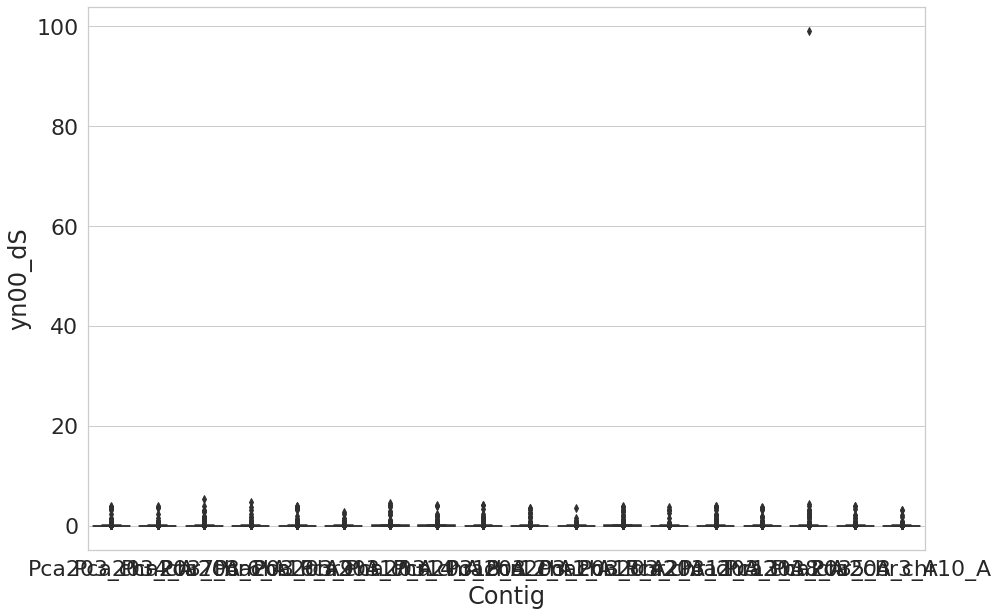

In [65]:
allele_chr=allele_df_merged[allele_df_merged['Contig'].str.contains("chr")]
plt.figure(figsize=(15,10))
sns.boxplot(y='yn00_dS', x='Contig', 
                 data=allele_chr, 
                 palette="colorblind")

In [202]:
def getnums(s, e,i):
   return list(range(s, e,i))
start, end, intval = 0, 9000000, 1000000
scale=getnums(start, end, intval)

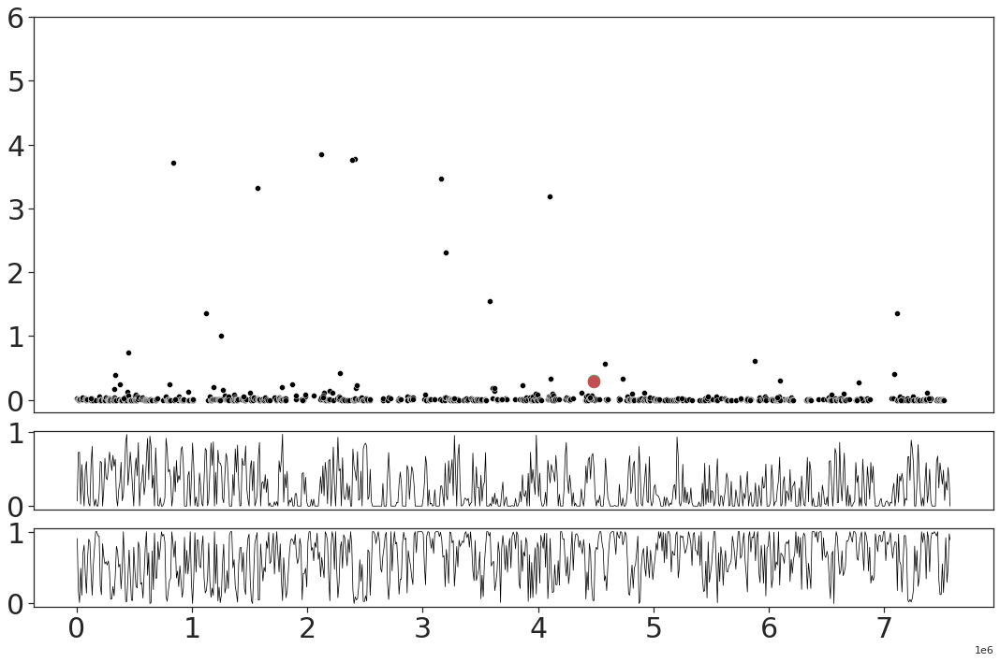

In [23]:
f, axs = plt.subplots(3, 1,sharex=True, figsize=(15,10), gridspec_kw=dict(height_ratios=[5,1,1]))
#f, axs = plt.subplots(2, 1,sharex=True, figsize=(15,10), gridspec_kw=dict(height_ratios=[5,1]))
g1 = sns.scatterplot(data=allele_df_HD,x='start',y='yn00_dS', ax=axs[0], legend=False, color='black')
sns.set()
sns.set_style('white')
g1.set_xlabel("Loci (bp) ")
g1.set_ylabel("synonymous divergence rate", fontsize=25)
#g1.text(allele_df_HD.start[allele_df_HD.Query=='Pca203_021774'],allele_df_HD.yn00_dS[allele_df_HD.Query=='Pca203_021774']+0.3,"bE-HD", color='green', fontsize = 20, style='italic')
#g1.text(allele_df_HD.start[allele_df_HD.Query=='Pca203_021773']+100000,allele_df_HD.yn00_dS[allele_df_HD.Query=='Pca203_021773']-0.2,"bW-HD", color='red', fontsize = 20, style='italic')
g1.tick_params(axis='both', which='major', labelsize=30)
g1.plot(allele_df_HD.start[allele_df_HD.Query=='Pca203_021774'],allele_df_HD.yn00_dS[allele_df_HD.Query=='Pca203_021774'],'g.', markersize=25)
g1.plot(allele_df_HD.start[allele_df_HD.Query=='Pca203_021773'],allele_df_HD.yn00_dS[allele_df_HD.Query=='Pca203_021773'],'r.', markersize=25)


g2 = sns.lineplot(x="1/2 position", y="Gene density", data=gene_density_chr4_A, ax=axs[1], size=1, legend=False, color='black')
g2.tick_params(bottom=False)
g2.set(xlabel=None)
g2.title.set_position([0, 1.1])
g2.yaxis.labelpad = 15
g2.set_xlabel("Gene position along chromosome 4A", fontsize=25)
g2.set_ylabel("Gene density", fontsize=20)
#plt.figure(figsize=(15,0.5))
g2.ticklabel_format(axis="x", style="sci")
g2.tick_params(axis='both', which='major', labelsize=30)

g3 = sns.lineplot(x="1/2 position", y="TE density", data=TE_density_chr4_A, ax=axs[2], size=1, legend=False, color='black')
g3.tick_params(bottom=False)
g3.set(xlabel=None)
#g3.set_xlabel("Gene position along chromosome 4A", fontsize=20)
g3.title.set_position([0, 1.1])
g3.yaxis.labelpad = 15
g3.set_ylabel("TE", fontsize=20)
#plt.figure(figsize=(15,0.5))
g3.ticklabel_format(axis="x", style="sci")
g3.tick_params(axis='both', which='major', labelsize=30)
g1.set_ylabel("")
g2.set_ylabel("")
g3.set_ylabel("")
tick_spacing = 1
g1.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
g1.axis(ymax=6)
g1.tick_params(left=True)
g2.tick_params(left=True)
g3.tick_params(left=True)
g3.tick_params(bottom=True)
#f.suptitle("dS value of genes on Pca 203 chr4", x=0.2, y=0.98, fontsize=23, fontweight="bold")
f.tight_layout()
plt.subplots_adjust(hspace = 0.1)
plt.show()

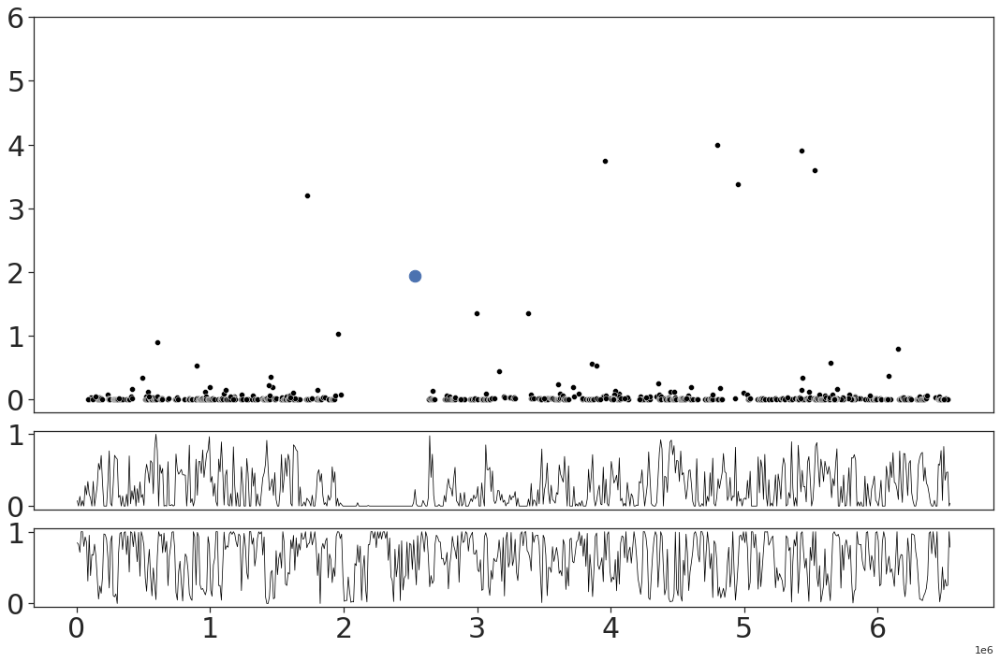

In [24]:
f, axs = plt.subplots(3, 1,sharex=True, figsize=(15,10), gridspec_kw=dict(height_ratios=[5,1,1]))

g1 = sns.scatterplot(data=allele_df_STE,x='start',y='yn00_dS', ax=axs[0], legend=False, color='black')
sns.set()
sns.set_style('white')
g1.set_xlabel("Loci (bp) ")
g1.set_ylabel("synonymous divergence rate", fontsize=20)
#g1.text(allele_df_STE.start[allele_df_STE.Query=='Pca203_001648'],allele_df_STE.yn00_dS[allele_df_STE.Query=='Pca203_001648']+0.2,"STE3.2 / STE3.3", color='red', fontsize = 20,style='italic')
g1.plot(allele_df_STE.start[allele_df_STE.Query=='Pca203_001648'],allele_df_STE.yn00_dS[allele_df_STE.Query=='Pca203_001648'],'b.', markersize=25)
g1.tick_params(axis='both', which='major', labelsize=30)

g2 = sns.lineplot(x="1/2 position", y="Gene density", data=gene_density_chr9_A, ax=axs[1], size=1, legend=False, color='black')
g2.tick_params(bottom=False)
g2.set_xlabel("Gene position along chromosome 9A", fontsize=20)
g2.title.set_position([0, 1.1])
g2.yaxis.labelpad = 9
g2.set_ylabel("Gene density", fontsize=20)
#plt.figure(figsize=(15,0.5))
g2.ticklabel_format(axis="x", style="sci")
g2.tick_params(axis='both', which='major', labelsize=30)

g3 = sns.lineplot(x="1/2 position", y="TE density", data=TE_density_chr9_A, ax=axs[2], size=1, legend=False, color='black')
g3.tick_params(bottom=False)
g3.set(xlabel=None)
#g3.set_xlabel("Gene position along chromosome 9A", fontsize=20)
g3.title.set_position([0, 1.1])
g3.yaxis.labelpad = 15
g3.set_ylabel("TE", fontsize=20)
#plt.figure(figsize=(15,0.5))
g3.ticklabel_format(axis="x", style="sci")
g3.tick_params(axis='both', which='major', labelsize=30)
g1.set_ylabel("")
g2.set_ylabel("")
g3.set_ylabel("")
tick_spacing = 1
g1.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
g1.tick_params(left=True)
g2.tick_params(left=True)
g3.tick_params(left=True)
g3.tick_params(bottom=True)
g1.axis(ymax=6)
#f.suptitle("dS value of genes on Pca 203 chr9", x=0.2, y=0.98, fontsize=23, fontweight="bold")
f.tight_layout()
plt.subplots_adjust(hspace = 0.1)
plt.show()

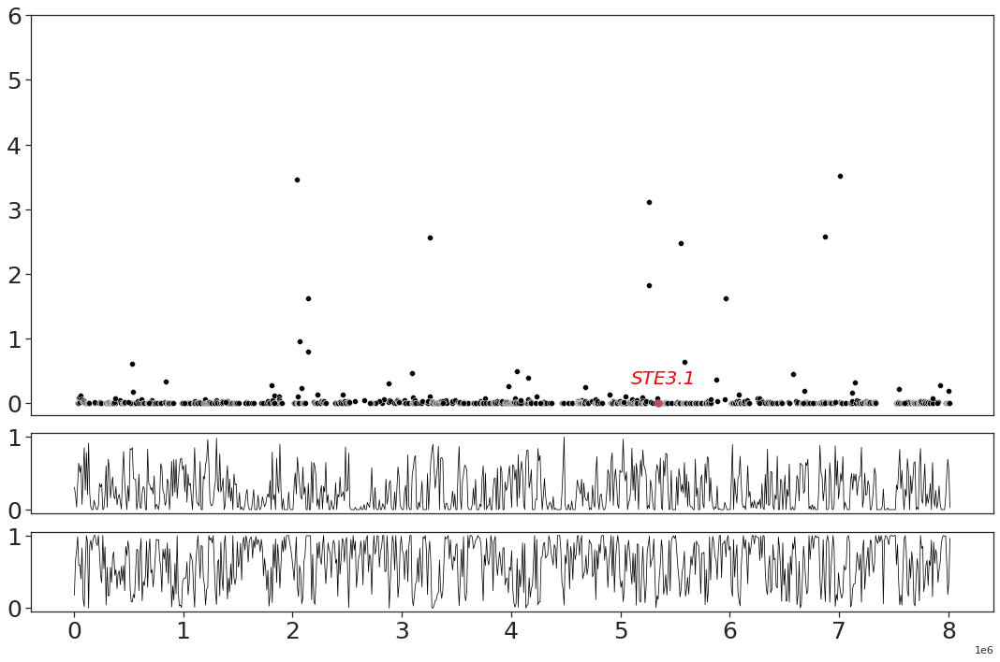

In [13]:
f, axs = plt.subplots(3, 1,sharex=True, figsize=(15,10), gridspec_kw=dict(height_ratios=[5,1,1]))

g1 = sns.scatterplot(data=allele_df_STE31,x='start',y='yn00_dS', ax=axs[0], legend=False, color='black')
sns.set()
sns.set_style('white')
g1.set_xlabel("Loci (bp) ")
g1.set_ylabel("synonymous divergence rate", fontsize=20)
g1.text(allele_df_STE31.start[allele_df_STE31.Query=='Pca203_012718']-250000,allele_df_STE31.yn00_dS[allele_df_STE31.Query=='Pca203_012718']+0.3,"STE3.1", color='red', size = 20, style='italic')
g1.plot(allele_df_STE31.start[allele_df_STE31.Query=='Pca203_012718'],allele_df_STE31.yn00_dS[allele_df_STE31.Query=='Pca203_012718'],'r.', markersize=15)
g1.tick_params(axis='both', which='major', labelsize=25)

g2 = sns.lineplot(x="1/2 position", y="Gene density", data=gene_density_chr1_A, ax=axs[1], size=1, legend=False, color='black')
g2.tick_params(bottom=False)
g2.set(xlabel=None)
g2.title.set_position([0, 1.1])
g2.set_xlabel("Gene position along chromosome 1A", fontsize=20)
g2.yaxis.labelpad = 15
g2.set_ylabel("Gene density", fontsize=20)
#plt.figure(figsize=(15,0.5))
g2.ticklabel_format(axis="x", style="sci")
g2.tick_params(axis='both', which='major', labelsize=25)

g3 = sns.lineplot(x="1/2 position", y="TE density", data=TE_density_chr1_A, ax=axs[2], size=1, legend=False, color='black')
g3.tick_params(bottom=False)
g3.set(xlabel=None)
#g3.set_xlabel("Gene position along chromosome 1A", fontsize=20)
g3.title.set_position([0, 1.1])
g3.yaxis.labelpad = 15
g3.set_ylabel("TE", fontsize=20)
#plt.figure(figsize=(15,0.5))
g3.ticklabel_format(axis="x", style="sci")
g3.tick_params(axis='both', which='major', labelsize=25)
g1.set_ylabel("")
g2.set_ylabel("")
g3.set_ylabel("")
tick_spacing = 1
g1.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
g1.tick_params(left=True)
g2.tick_params(left=True)
g3.tick_params(left=True)
g3.tick_params(bottom=True)
g1.axis(ymax=6)
#f.suptitle("dS value of genes on Pca 203 chr1", x=0.2, y=0.98, fontsize=23, fontweight="bold")
f.tight_layout()
plt.subplots_adjust(hspace = 0.1)
plt.show()